# NGC 7078 Analysis

In [2]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
import glob
import re
from astropy.stats import sigma_clip
%matplotlib inline 

In [3]:
target = 'NGC7078'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '21:29:58.33'
cluster_dec = '12:10:01.2'

## Cluster Snapshot

In [3]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

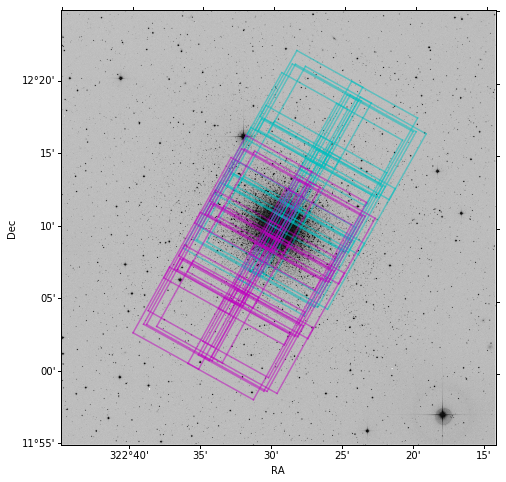

In [4]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
mp.show()

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC7078...
Finished reading optical catalog.


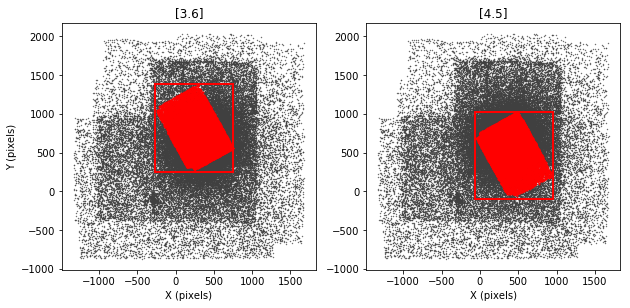

In [17]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'DeepMosaic/I1-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'DeepMosaic/I2-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymin']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymax'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmin']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmax'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('[3.6]')
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymin']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymax'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmin']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmax'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.set_xlabel('X (pixels)')
ax2.set_title('[4.5]')


# Add transformed catalogs
I1ids, I1x, I1y, I1mag, I1err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I1_deep_dn.alf')
I2ids, I2x, I2y, I2mag, I2err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I2_deep_dn.alf')

filesI1, x_offI1, y_offI1, transformI1, dofI1 = read_dao.read_mch(folder+'DeepMosaic/op-I1-deep.mch')
filesI2, x_offI2, y_offI2, transformI2, dofI2 = read_dao.read_mch(folder+'DeepMosaic/op-I2-deep.mch')

xI1 = float(x_offI1[1])+float(transformI1[1][0])*I1x+float(transformI1[1][1])*I1y
yI1 = float(y_offI1[1])+float(transformI1[1][2])*I1x+float(transformI1[1][3])*I1y
xI2 = float(x_offI2[1])+float(transformI2[1][0])*I2x+float(transformI2[1][1])*I2y
yI2 = float(y_offI2[1])+float(transformI2[1][2])*I2x+float(transformI2[1][3])*I2y

ax1.plot(xI1, yI1, '.', markersize=1.8, color='r')
ax2.plot(xI2, yI2, '.', markersize=1.8, color='r')


mp.show()

# Calibration

In [3]:
calibration.find_lst_stars(target, 'I1', data_dir=folder)
calibration.find_lst_stars(target, 'I2', data_dir=folder)

[79385] []
[53518] []
[70866] []
[45716] []
[76183] [76487 76109 75937 76357 76173 76329 75848 76179]
[49526] []
[54348] [54553]
[34719] []
[31797] []
[42462] [43152]
[37011] []
[69905] [69531 69608 70279 69812 69599 70182]
[77319] []
[28335] []
[37849] []
[72854] []
[30889] []
[37414] []
[40667] []
[25365] []
[69768] [69227]
[28887] [28695]
[33328] []
[32473] []
[18727] []
[21076] []
[17704] []
[22710] []
[59511] []
[17515] [17343]
[54069] []
[19230] []
[15379] []
[18758] []
[13561] [13628]
[19853] []
[25375] [25759 25774 25561 25068 25569 25445 25264 25030 25573 24891 25667 25089
 25361]
[15147] []
[13147] []
[15752] []
[18317] []
[24226] [23838 24372 23967 24070 24423 24202 24030 24095 24385]
[16992] []
[17401] [17177 17283 17173]
[15845] []
[12763] []
[31280] []
[14933] []
[31549] []
[12068] []
[14596] [14559]
[11377] []
[24218] [24382 24108 24012 23884]
[13947] []
[9820] []
[84533] []
[71900] [71947 72197 71890]
[85714] [85722]
[76490] [76523 76098 76213 76475]
[83951] []
[70772] 

In [4]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/')
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/')


  READ NOISE (ADU; 1 frame) =     3.95        GAIN (e-/ADU; 1 frame) =     3.70
 LOW GOOD DATUM (in sigmas) =    10.00      HIGH GOOD DATUM (in ADU) = 30000.00
             FWHM OF OBJECT =     2.00         THRESHOLD (in sigmas) =     6.00
  LS (LOW SHARPNESS CUTOFF) =     0.30    HS (HIGH SHARPNESS CUTOFF) =     1.40
  LR (LOW ROUNDNESS CUTOFF) =    -1.00    HR (HIGH ROUNDNESS CUTOFF) =     1.00
             WATCH PROGRESS =    -1.00                FITTING RADIUS =     2.00
                 PSF RADIUS =     9.00                  VARIABLE PSF =     0.00
              SKY ESTIMATOR =     0.00            ANALYTIC MODEL PSF =     2.00
  EXTRA PSF CLEANING PASSES =     5.00       USE SATURATED PSF STARS =     0.00
       PERCENT ERROR (in %) =     0.75          PROFILE ERROR (in %) =     5.00

 Command: at NGC7078:I1_46739968_01.fits
at NGC7078:I1_46739968_01.fits

     NGC7078:I1_46739968_01...               


                                      Picture size:    256   256


 Command: 

 PHO> 


 Input position file (default 
                       NGC7078:I1_46739968_08.coo): 

   Output file (default NGC7078:I1_46739968_08.ap): 


 Command: at NGC7078:I1_46739968_09.fits
at NGC7078:I1_46739968_09.fits

     NGC7078:I1_46739968_09...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46739968_25.coo): 

   Output file (default NGC7078:I1_46739968_25.ap): 


 Command: at NGC7078:I1_46739968_26.fits
at NGC7078:I1_46739968_26.fits

     NGC7078:I1_46739968_26...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46740480_12.coo): 

   Output file (default NGC7078:I1_46740480_12.ap): 


 Command: at NGC7078:I1_46740480_13.fits
at NGC7078:I1_46740480_13.fits

     NGC7078:I1_46740480_13...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46740480_29.coo): 

   Output file (default NGC7078:I1_46740480_29.ap): 


 Command: at NGC7078:I1_46740480_30.fits
at NGC7078:I1_46740480_30.fits

     NGC7078:I1_46740480_30...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46740992_16.coo): 

   Output file (default NGC7078:I1_46740992_16.ap): 


 Command: at NGC7078:I1_46740992_17.fits
at NGC7078:I1_46740992_17.fits

     NGC7078:I1_46740992_17...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46741248_03.coo): 

   Output file (default NGC7078:I1_46741248_03.ap): 


 Command: at NGC7078:I1_46741248_04.fits
at NGC7078:I1_46741248_04.fits

     NGC7078:I1_46741248_04...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46741248_20.coo): 

   Output file (default NGC7078:I1_46741248_20.ap): 


 Command: at NGC7078:I1_46741248_21.fits
at NGC7078:I1_46741248_21.fits

     NGC7078:I1_46741248_21...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46741760_07.coo): 

   Output file (default NGC7078:I1_46741760_07.ap): 


 Command: at NGC7078:I1_46741760_08.fits
at NGC7078:I1_46741760_08.fits

     NGC7078:I1_46741760_08...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46741760_24.coo): 

   Output file (default NGC7078:I1_46741760_24.ap): 


 Command: at NGC7078:I1_46741760_25.fits
at NGC7078:I1_46741760_25.fits

     NGC7078:I1_46741760_25...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46742272_11.coo): 

   Output file (default NGC7078:I1_46742272_11.ap): 


 Command: at NGC7078:I1_46742272_12.fits
at NGC7078:I1_46742272_12.fits

     NGC7078:I1_46742272_12...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46742272_28.coo): 

   Output file (default NGC7078:I1_46742272_28.ap): 


 Command: at NGC7078:I1_46742272_29.fits
at NGC7078:I1_46742272_29.fits

     NGC7078:I1_46742272_29...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position file (default 
                       NGC7078:I1_46742784_15.coo): 

   Output file (default NGC7078:I1_46742784_15.ap): 


 Command: at NGC7078:I1_46742784_16.fits
at NGC7078:I1_46742784_16.fits

     NGC7078:I1_46742784_16...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 1


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position file (default 
                       NGC7078:I1_46742784_24.coo): 

   Output file (default NGC7078:I1_46742784_24.ap): 


 Command: at NGC7078:I1_46742784_25.fits
at NGC7078:I1_46742784_25.fits

     NGC7078:I1_46742784_25...               


                         

 PHO> 


 Input position file (default 
                       NGC7078:I1_46743296_02.coo): 

   Output file (default NGC7078:I1_46743296_02.ap): 


 Command: at NGC7078:I1_46743296_03.fits
at NGC7078:I1_46743296_03.fits

     NGC7078:I1_46743296_03...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46743296_19.coo): 

   Output file (default NGC7078:I1_46743296_19.ap): 


 Command: at NGC7078:I1_46743296_20.fits
at NGC7078:I1_46743296_20.fits

     NGC7078:I1_46743296_20...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46743808_06.coo): 

   Output file (default NGC7078:I1_46743808_06.ap): 


 Command: at NGC7078:I1_46743808_07.fits
at NGC7078:I1_46743808_07.fits

     NGC7078:I1_46743808_07...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46743808_23.coo): 

   Output file (default NGC7078:I1_46743808_23.ap): 


 Command: at NGC7078:I1_46743808_24.fits
at NGC7078:I1_46743808_24.fits

     NGC7078:I1_46743808_24...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46848000_10.coo): 

   Output file (default NGC7078:I1_46848000_10.ap): 


 Command: at NGC7078:I1_46848000_11.fits
at NGC7078:I1_46848000_11.fits

     NGC7078:I1_46848000_11...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46848000_27.coo): 

   Output file (default NGC7078:I1_46848000_27.ap): 


 Command: at NGC7078:I1_46848000_28.fits
at NGC7078:I1_46848000_28.fits

     NGC7078:I1_46848000_28...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I1_46848768_14.coo): 

   Output file (default NGC7078:I1_46848768_14.ap): 


 Command: at NGC7078:I1_46848768_15.fits
at NGC7078:I1_46848768_15.fits

     NGC7078:I1_46848768_15...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position file (default 
                       NGC7078:I1_46849536_01.coo): 

   Output file (default NGC7078:I1_46849536_01.ap): 


 Command: at NGC7078:I1_46849536_02.fits
at NGC7078:I1_46849536_02.fits

     NGC7078:I1_46849536_02...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIU

 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position file (default 
                       NGC7078:I1_46849536_10.coo): 

   Output file (default NGC7078:I1_46849536_10.ap): 


 Command: at NGC7078:I1_46849536_11.fits
at NGC7078:I1_46849536_11.fits

     NGC7078:I1_46849536_11...               


                                      Picture size:    256   256


 Command: phot
phot

     

 PHO> 


 Input position file (default 
                       NGC7078:I1_46849536_18.coo): 

   Output file (default NGC7078:I1_46849536_18.ap): 


 Command: at NGC7078:I1_46849536_19.fits
at NGC7078:I1_46849536_19.fits

     NGC7078:I1_46849536_19...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

                       NGC7078:I2_46739968_02.coo): 

   Output file (default NGC7078:I2_46739968_02.ap): 


 Command: at NGC7078:I2_46739968_03.fits
at NGC7078:I2_46739968_03.fits

     NGC7078:I2_46739968_03...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position file (default 
                       NGC

 PHO> 


 Input position file (default 
                       NGC7078:I2_46739968_11.coo): 

   Output file (default NGC7078:I2_46739968_11.ap): 


 Command: at NGC7078:I2_46739968_12.fits
at NGC7078:I2_46739968_12.fits

     NGC7078:I2_46739968_12...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46739968_28.coo): 

   Output file (default NGC7078:I2_46739968_28.ap): 


 Command: at NGC7078:I2_46739968_29.fits
at NGC7078:I2_46739968_29.fits

     NGC7078:I2_46739968_29...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46740480_15.coo): 

   Output file (default NGC7078:I2_46740480_15.ap): 


 Command: at NGC7078:I2_46740480_16.fits
at NGC7078:I2_46740480_16.fits

     NGC7078:I2_46740480_16...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46740992_02.coo): 

   Output file (default NGC7078:I2_46740992_02.ap): 


 Command: at NGC7078:I2_46740992_03.fits
at NGC7078:I2_46740992_03.fits

     NGC7078:I2_46740992_03...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46740992_19.coo): 

   Output file (default NGC7078:I2_46740992_19.ap): 


 Command: at NGC7078:I2_46740992_20.fits
at NGC7078:I2_46740992_20.fits

     NGC7078:I2_46740992_20...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46741248_06.coo): 

   Output file (default NGC7078:I2_46741248_06.ap): 


 Command: at NGC7078:I2_46741248_07.fits
at NGC7078:I2_46741248_07.fits

     NGC7078:I2_46741248_07...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46741248_23.coo): 

   Output file (default NGC7078:I2_46741248_23.ap): 


 Command: at NGC7078:I2_46741248_24.fits
at NGC7078:I2_46741248_24.fits

     NGC7078:I2_46741248_24...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46741760_10.coo): 

   Output file (default NGC7078:I2_46741760_10.ap): 


 Command: at NGC7078:I2_46741760_11.fits
at NGC7078:I2_46741760_11.fits

     NGC7078:I2_46741760_11...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46741760_27.coo): 

   Output file (default NGC7078:I2_46741760_27.ap): 


 Command: at NGC7078:I2_46741760_28.fits
at NGC7078:I2_46741760_28.fits

     NGC7078:I2_46741760_28...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46742272_14.coo): 

   Output file (default NGC7078:I2_46742272_14.ap): 


 Command: at NGC7078:I2_46742272_15.fits
at NGC7078:I2_46742272_15.fits

     NGC7078:I2_46742272_15...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46742784_01.coo): 

   Output file (default NGC7078:I2_46742784_01.ap): 


 Command: at NGC7078:I2_46742784_02.fits
at NGC7078:I2_46742784_02.fits

     NGC7078:I2_46742784_02...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46742784_18.coo): 

   Output file (default NGC7078:I2_46742784_18.ap): 


 Command: at NGC7078:I2_46742784_19.fits
at NGC7078:I2_46742784_19.fits

     NGC7078:I2_46742784_19...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46743296_05.coo): 

   Output file (default NGC7078:I2_46743296_05.ap): 


 Command: at NGC7078:I2_46743296_06.fits
at NGC7078:I2_46743296_06.fits

     NGC7078:I2_46743296_06...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46743296_22.coo): 

   Output file (default NGC7078:I2_46743296_22.ap): 


 Command: at NGC7078:I2_46743296_23.fits
at NGC7078:I2_46743296_23.fits

     NGC7078:I2_46743296_23...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46743808_09.coo): 

   Output file (default NGC7078:I2_46743808_09.ap): 


 Command: at NGC7078:I2_46743808_10.fits
at NGC7078:I2_46743808_10.fits

     NGC7078:I2_46743808_10...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46743808_26.coo): 

   Output file (default NGC7078:I2_46743808_26.ap): 


 Command: at NGC7078:I2_46743808_27.fits
at NGC7078:I2_46743808_27.fits

     NGC7078:I2_46743808_27...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46848000_13.coo): 

   Output file (default NGC7078:I2_46848000_13.ap): 


 Command: at NGC7078:I2_46848000_14.fits
at NGC7078:I2_46848000_14.fits

     NGC7078:I2_46848000_14...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46848000_30.coo): 

   Output file (default NGC7078:I2_46848000_30.ap): 


 Command: at NGC7078:I2_46848768_01.fits
at NGC7078:I2_46848768_01.fits

     NGC7078:I2_46848768_01...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46848768_17.coo): 

   Output file (default NGC7078:I2_46848768_17.ap): 


 Command: at NGC7078:I2_46848768_18.fits
at NGC7078:I2_46848768_18.fits

     NGC7078:I2_46848768_18...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46849536_04.coo): 

   Output file (default NGC7078:I2_46849536_04.ap): 


 Command: at NGC7078:I2_46849536_05.fits
at NGC7078:I2_46849536_05.fits

     NGC7078:I2_46849536_05...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC7078:I2_46849536_21.coo): 

   Output file (default NGC7078:I2_46849536_21.ap): 


 Command: at NGC7078:I2_46849536_22.fits
at NGC7078:I2_46849536_22.fits

     NGC7078:I2_46849536_22...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

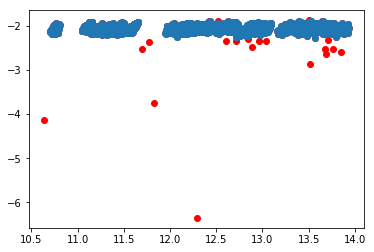

-2.07441064491 0.0639530135053
-2.07425097125 0.0639465281204
There are 49 psf stars.


calibration.py:338: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 637896 but corresponding boolean dimension is 2595


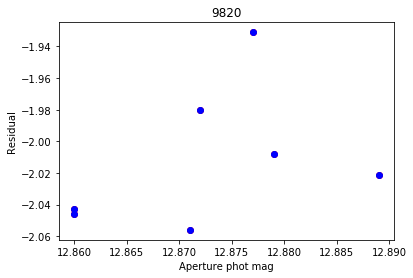

0.029 0.119
0.00963412302862 0.0381265347634


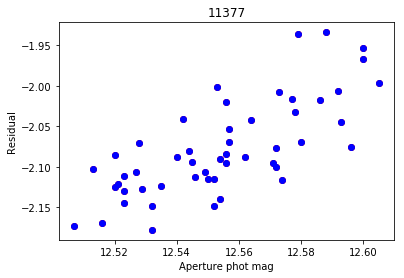

0.098 0.195
0.0256844184332 0.0435060085471


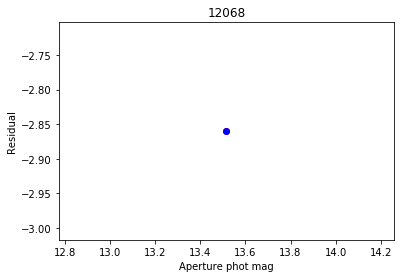

0.0 0.0
0.0 0.0


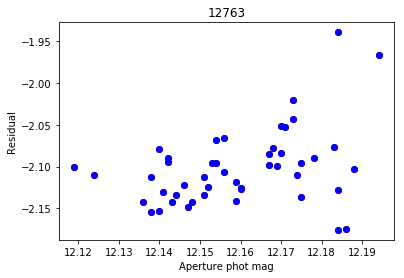

0.075 0.238
0.0175556284575 0.0423643789829


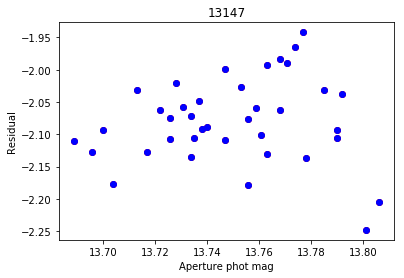

0.117 0.33
0.029633086341 0.0701154222527


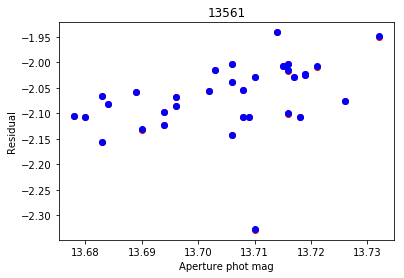

0.054 0.383
0.0139511807874 0.0650067313036


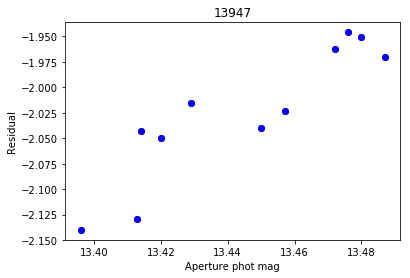

0.091 0.12
0.0303238716209 0.0383412256817


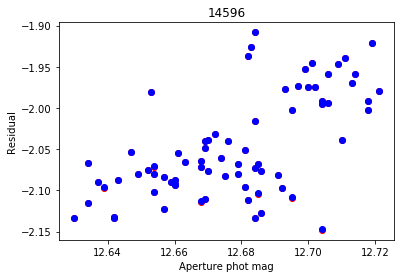

0.091 0.259
0.0236570487012 0.0505590387451


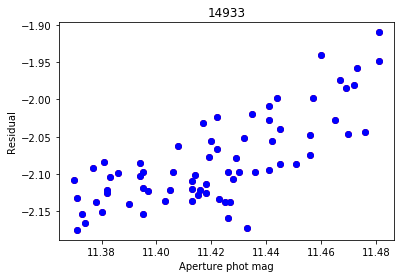

0.111 0.215
0.0307025924585 0.0416117232304


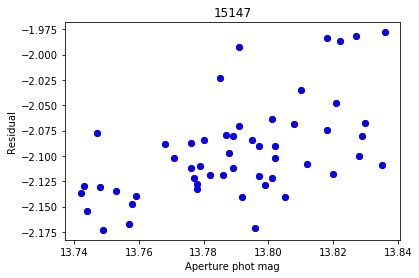

0.094 0.183
0.0257483923397 0.0394677114766


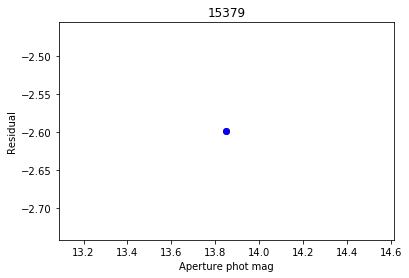

0.0 0.0
0.0 0.0


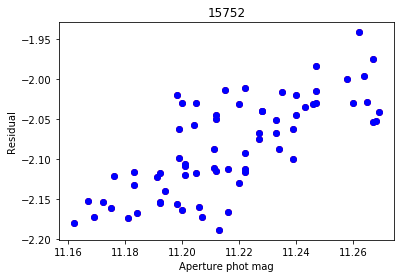

0.107 0.199
0.0275005157651 0.042920003899


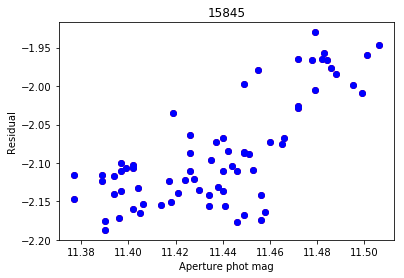

0.129 0.221
0.0332259999101 0.0498170706452


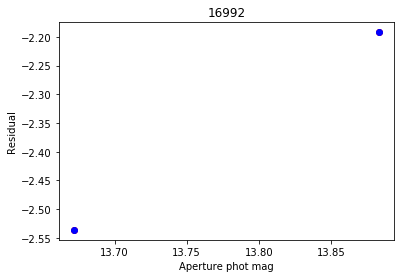

0.211 0.133
0.1055 0.0665


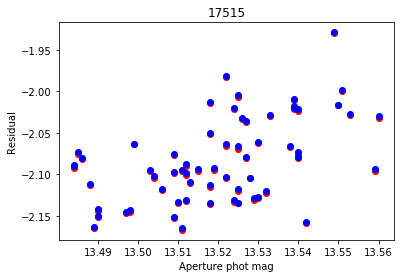

0.076 0.221
0.0191761645321 0.0440264234584


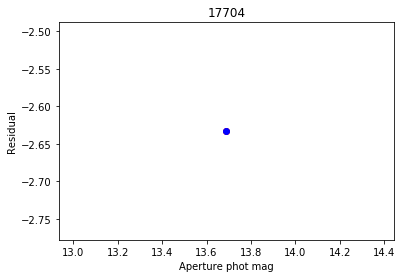

0.0 0.0
0.0 0.0


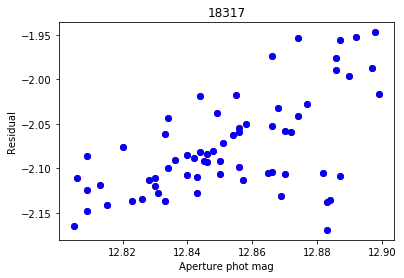

0.094 0.225
0.0251560236923 0.0451412129797


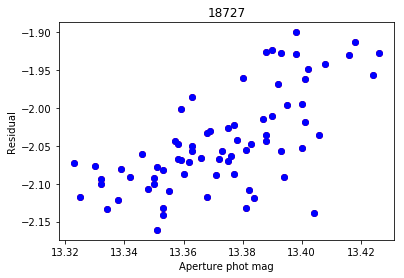

0.103 0.245
0.024369112234 0.0514120849316


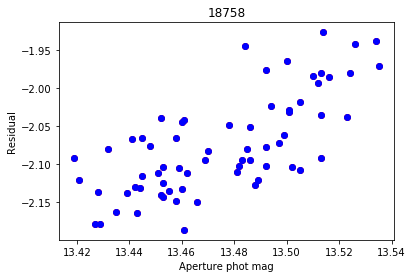

0.116 0.218
0.0303969798948 0.0475256036563


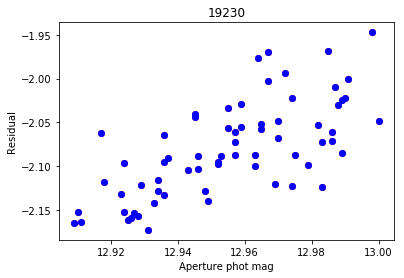

0.091 0.17
0.0241381724664 0.040879951279


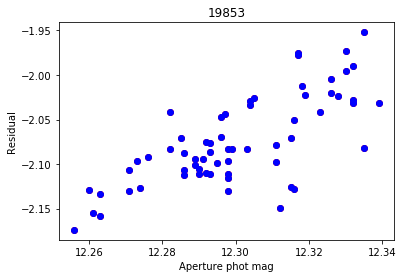

0.083 0.174
0.0210769863833 0.0374631556633


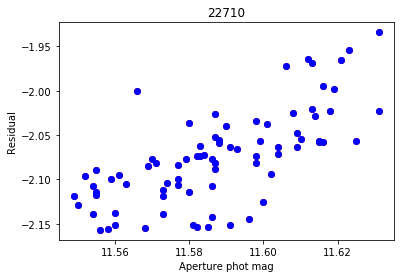

0.082 0.178
0.0216309926668 0.0404443753815


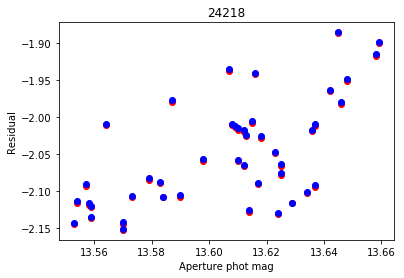

0.106 0.224
0.0302808052968 0.056740615236


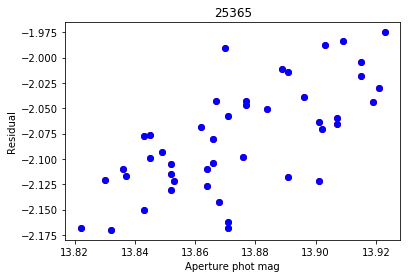

0.101 0.178
0.0274187464032 0.0392764560519


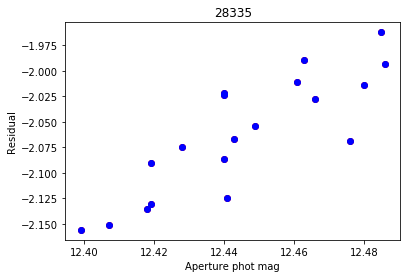

0.087 0.119
0.0256778464937 0.0377266741054


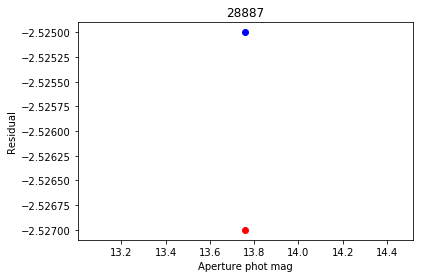

0.0 0.0
0.0 0.0


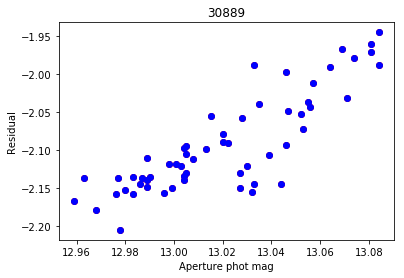

0.125 0.168
0.0334463428165 0.0396311621465


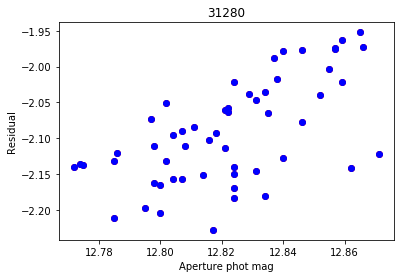

0.099 0.228
0.0251565675831 0.0594783383029


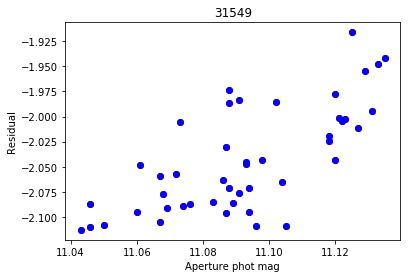

0.092 0.173
0.0251634449212 0.0384238684582


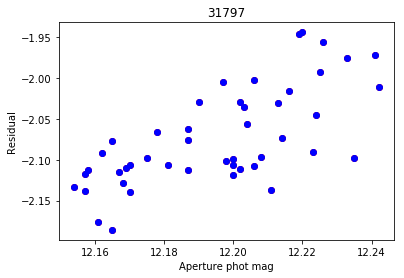

0.088 0.187
0.0249796514541 0.0457301249607


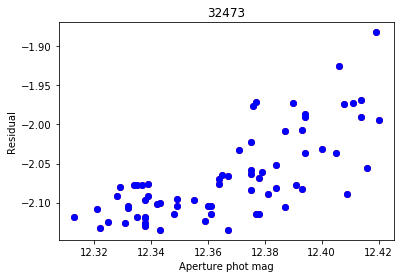

0.107 0.201
0.0286348189647 0.0397045954262


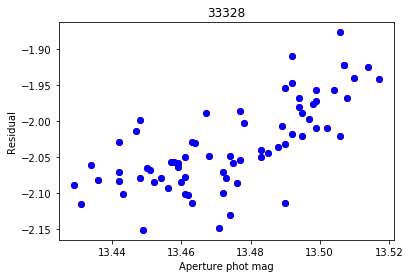

0.088 0.237
0.0227296536 0.0470250048405


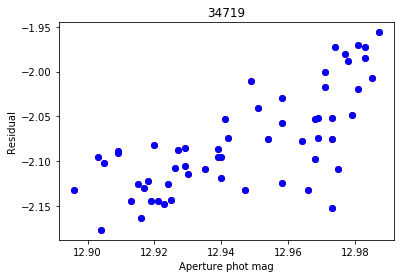

0.091 0.183
0.0263673006243 0.0411511128691


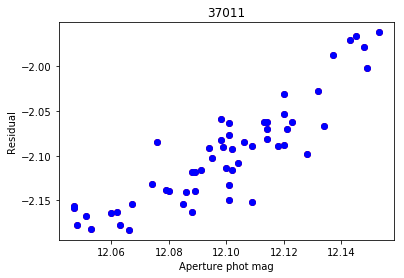

0.106 0.15
0.0273687906479 0.0356377751888


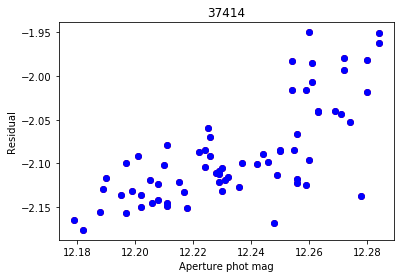

0.105 0.206
0.0280583539163 0.0406565229347


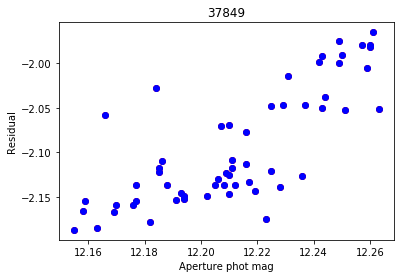

0.108 0.186
0.0302308006504 0.0454365958776


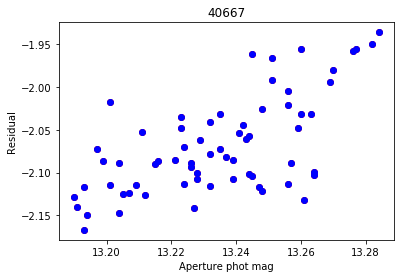

0.094 0.186
0.0246810926842 0.0446011839602


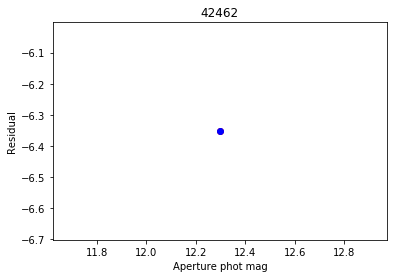

0.0 0.0
0.0 0.0


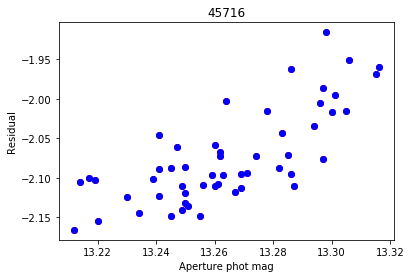

0.104 0.189
0.0266971731283 0.0421709298742


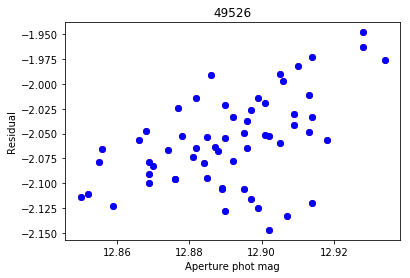

0.084 0.173
0.0190704177546 0.0397390935422


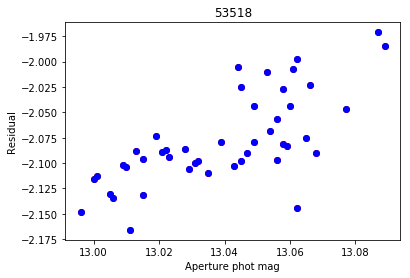

0.093 0.157
0.0240364537965 0.0322463817475


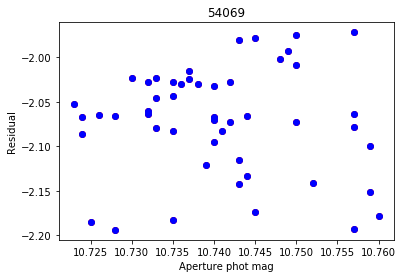

0.037 0.227
0.0100582503449 0.0608828415894


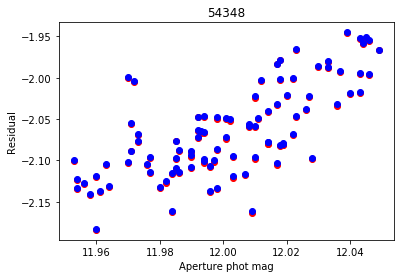

0.096 0.201
0.0255399632705 0.0406449309503


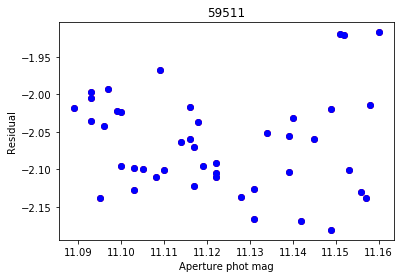

0.071 0.259
0.0214862535336 0.0683782737896


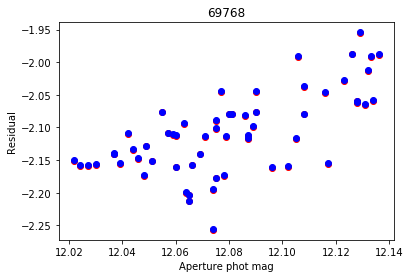

0.114 0.247
0.0318058694191 0.0477888622161


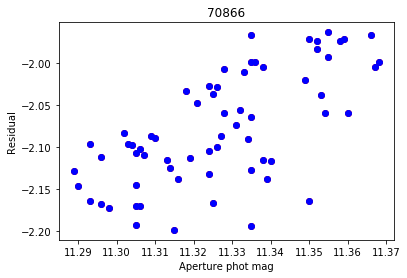

0.079 0.228
0.0211289307817 0.0553056145967


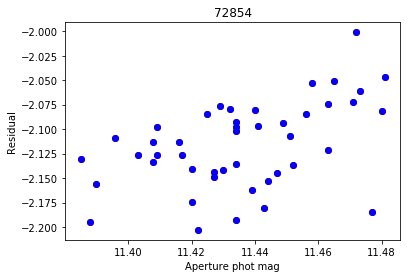

0.096 0.189
0.0250533652652 0.0388935870178


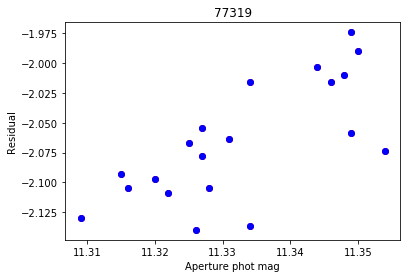

0.045 0.148
0.0131343062245 0.0406815375816


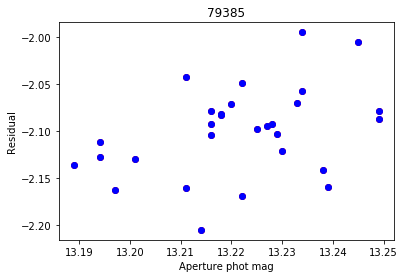

0.06 0.19
0.01584902012 0.043043102585


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


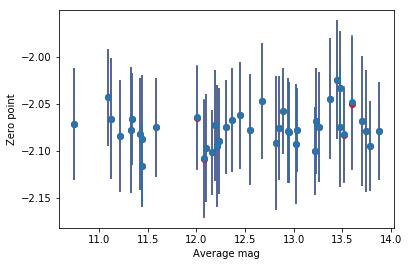

-2.0751560323 0.0190908989811
-2.0750097421 0.0191169199255


In [5]:
I1zp, I1zper = calibration.find_zp_bcds('I1', data_dir=folder)

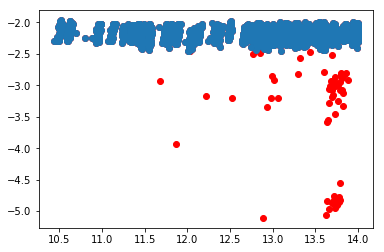

-2.19016630469 0.0930534342517
-2.18550353737 0.0896756977259
There are 62 psf stars.


calibration.py:338: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 703352 but corresponding boolean dimension is 3316


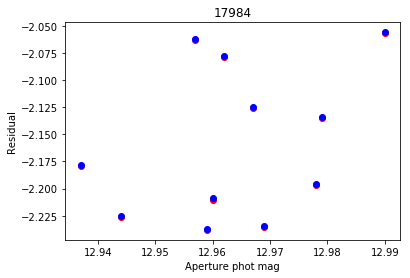

0.053 0.184
0.0146276089006 0.0627366264436


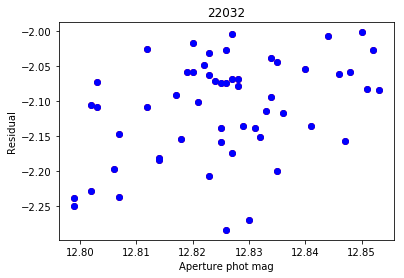

0.054 0.278
0.0141470903471 0.0674589951975


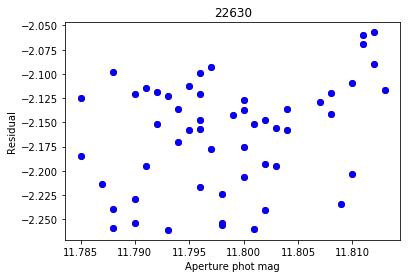

0.028 0.192
0.00754913034717 0.0536445939067


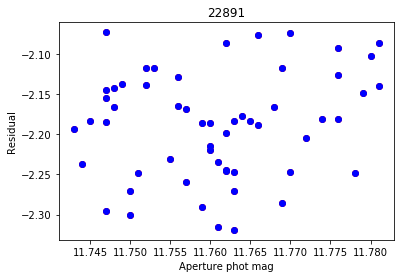

0.038 0.262
0.0105195244858 0.064345517818


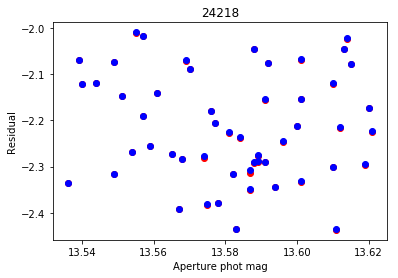

0.085 0.483
0.0232870561095 0.119298186585


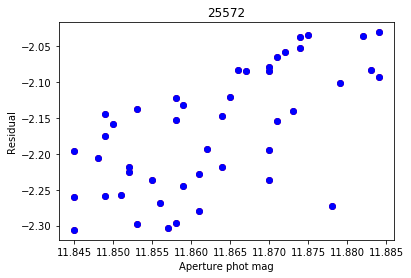

0.039 0.251
0.0112770783128 0.0768164778322


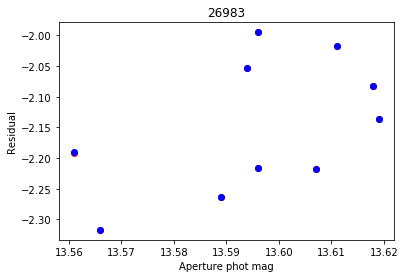

0.058 0.292
0.0188045207331 0.0951599180328


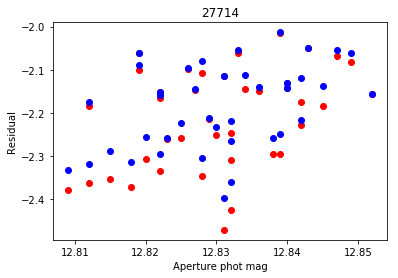

0.043 0.376
0.0106369779141 0.0935265961885


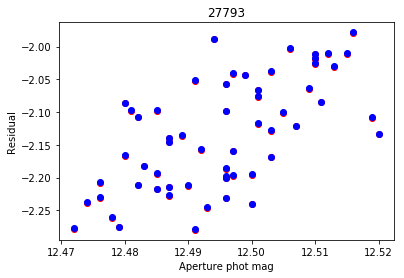

0.048 0.288
0.0121442602033 0.0767212010286


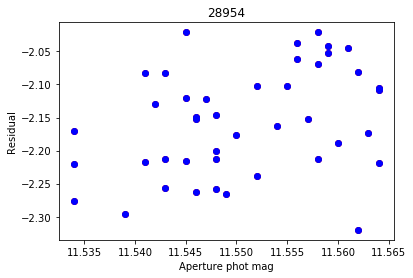

0.03 0.316
0.00860157078741 0.0772637731643


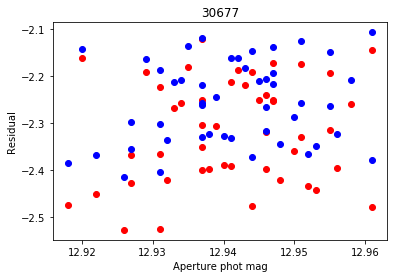

0.043 0.284
0.0105578232801 0.0864714775679


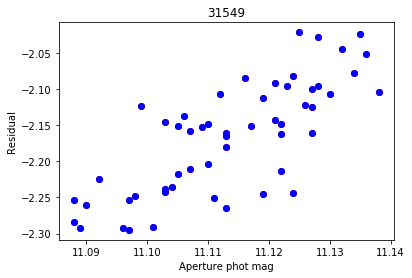

0.05 0.246
0.013410335776 0.0671903939546


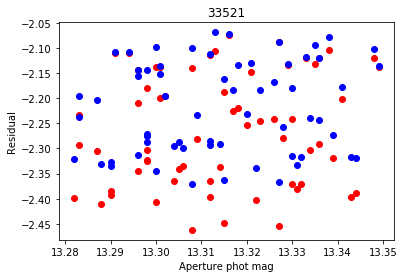

0.067 0.312
0.0180350854728 0.0904429439958


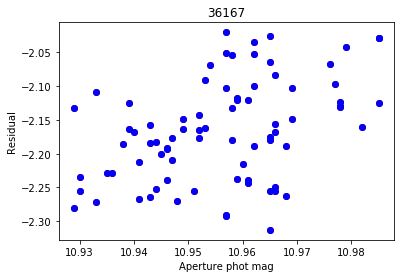

0.056 0.301
0.0141707489775 0.0698967031463


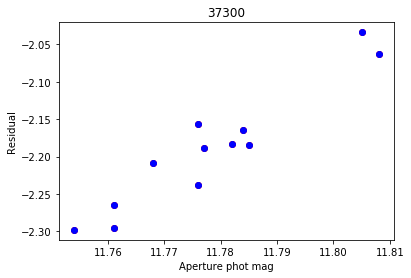

0.054 0.218
0.0157927110473 0.0633837518612


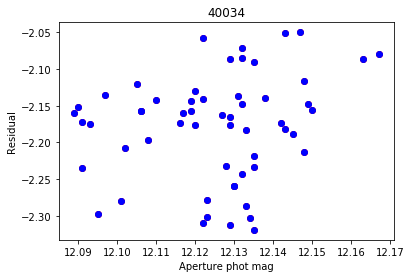

0.078 0.274
0.0182615315183 0.0697372900791


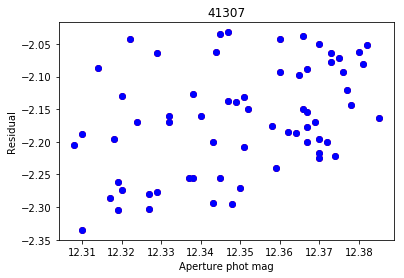

0.077 0.28
0.0216595825166 0.0751611034997


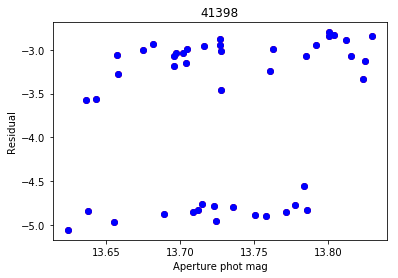

0.206 2.084
0.0565045611619 0.856025453643


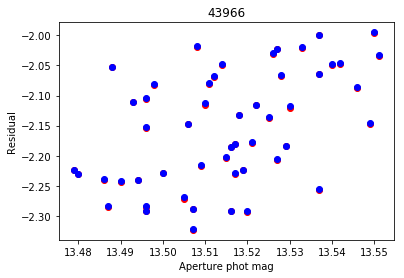

0.072 0.304
0.0187030046703 0.0859970359726


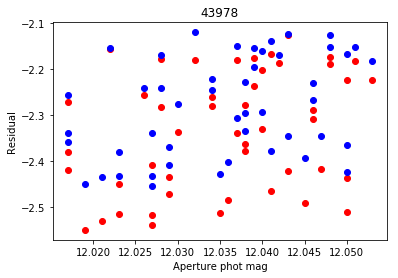

0.036 0.328
0.0100969945194 0.10296911332


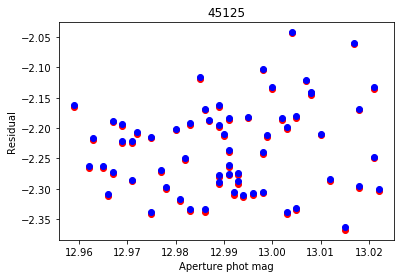

0.063 0.333
0.0164672422715 0.0715948259165


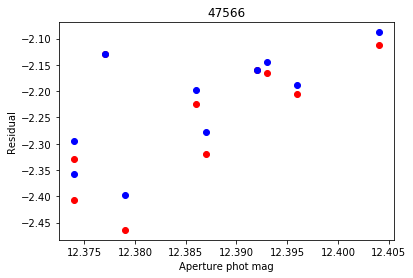

0.03 0.284
0.00963119930227 0.0914158082609


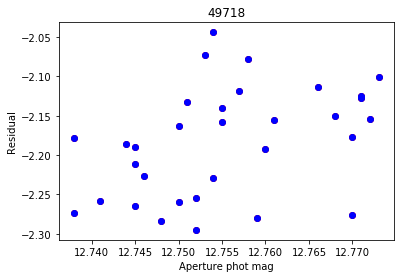

0.035 0.249
0.010255333978 0.0650639108877


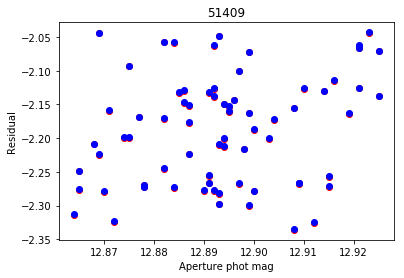

0.061 0.33
0.0160042768535 0.0779261549028


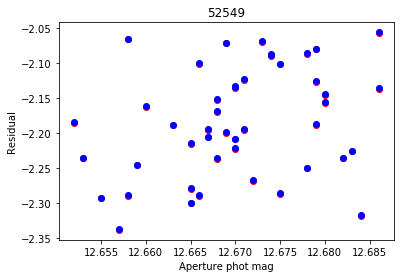

0.034 0.277
0.00868192389215 0.0742342505224


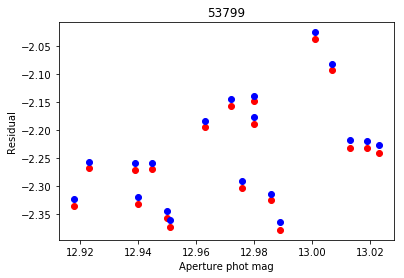

0.105 0.327
0.0310758165008 0.0824382250041


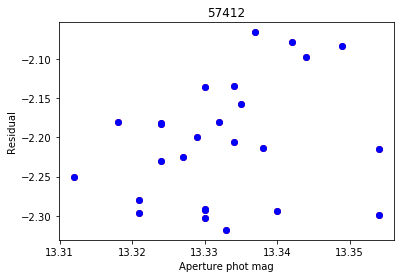

0.042 0.25
0.0102215111378 0.0733293312966


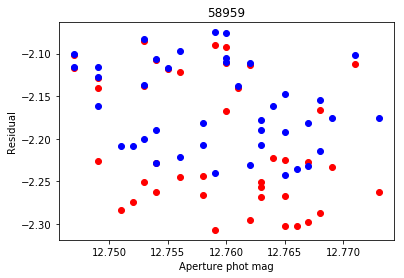

0.026 0.173
0.00681287230398 0.0528428467112


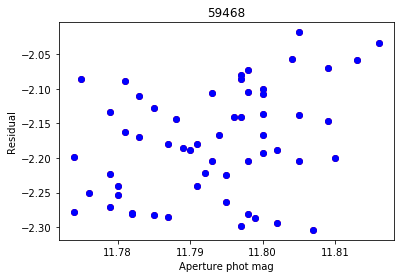

0.042 0.288
0.0105578766624 0.073986551813


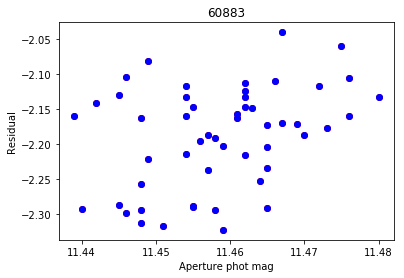

0.041 0.274
0.00976141040711 0.0688194297079


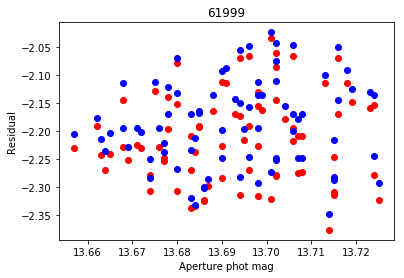

0.068 0.337
0.0168211249493 0.0767904254341


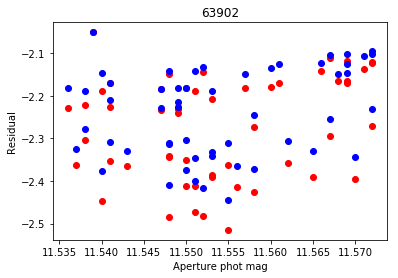

0.036 0.409
0.0106026992003 0.100890082906


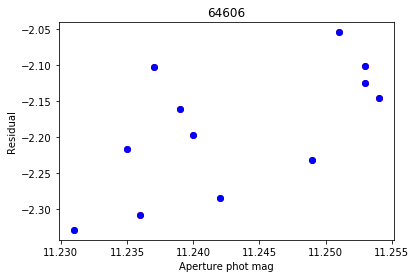

0.023 0.255
0.00784573486396 0.0799294828097


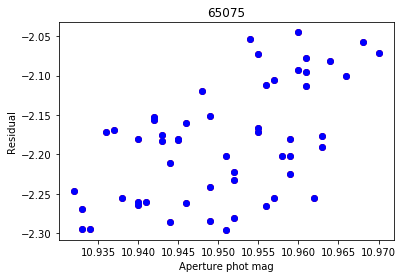

0.038 0.242
0.00982626864866 0.0673437148213


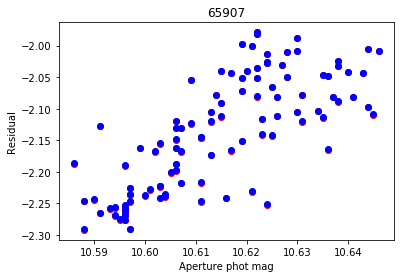

0.06 0.286
0.015534514041 0.0774796949749


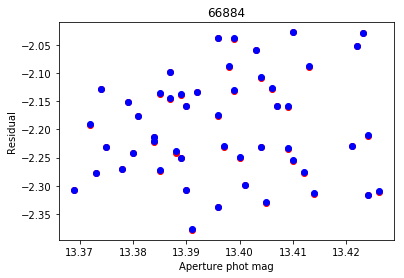

0.057 0.333
0.0151062900806 0.0901943146767


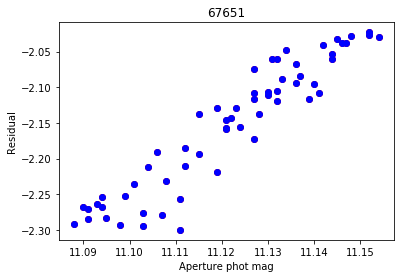

0.066 0.236
0.0183347272197 0.0711802465576


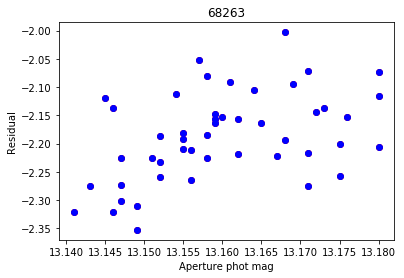

0.039 0.331
0.010553106441 0.0730079874578


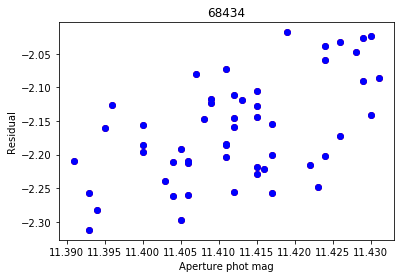

0.04 0.268
0.0106524097792 0.0700015256916


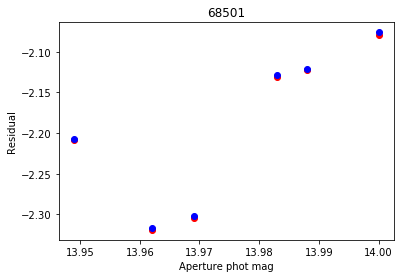

0.051 0.203
0.0170236763232 0.0797400289831


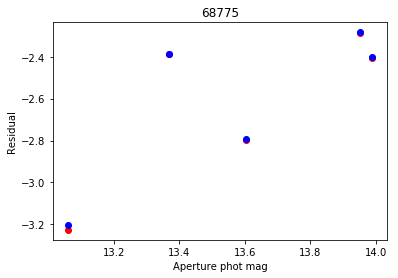

0.93 0.643
0.352710646281 0.236094387904


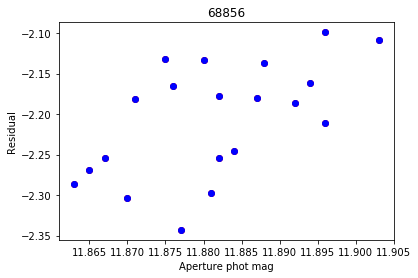

0.04 0.225
0.0109337779381 0.063551770235


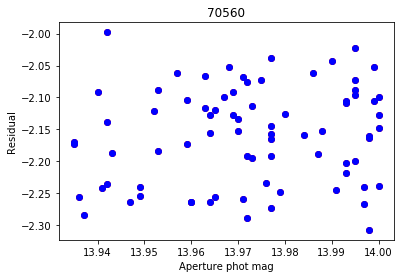

0.065 0.365
0.0194118008736 0.0747264105327


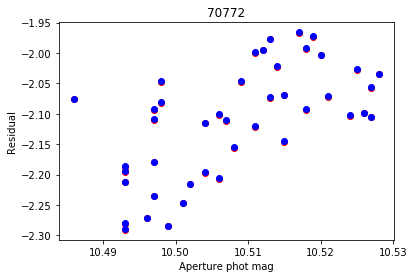

0.042 0.3
0.0113791531801 0.084636000431


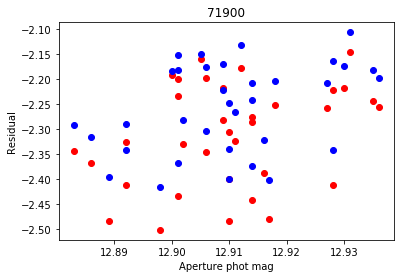

0.053 0.282
0.0135960316315 0.084261128145


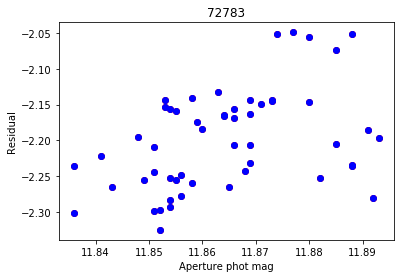

0.057 0.251
0.0145788388368 0.0640876435758


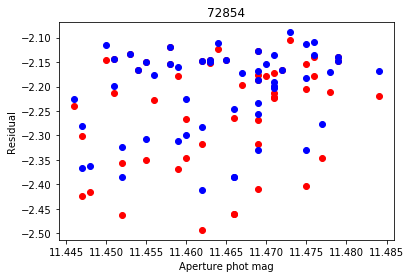

0.038 0.312
0.00954425966547 0.0843470085494


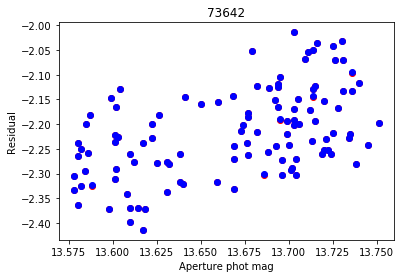

0.173 0.314
0.0514034682477 0.0756077016689


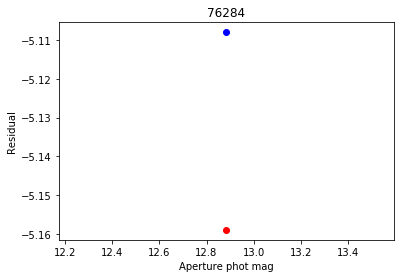

0.0 0.0
0.0 0.0


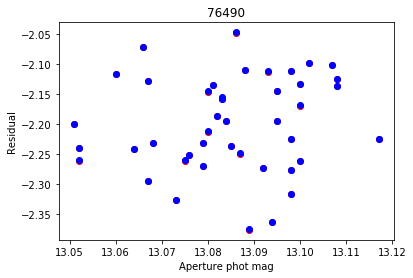

0.066 0.331
0.0158508802792 0.0772833282005


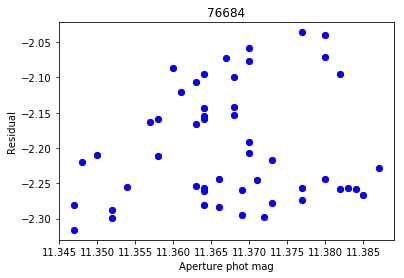

0.04 0.257
0.010208329932 0.0792072824935


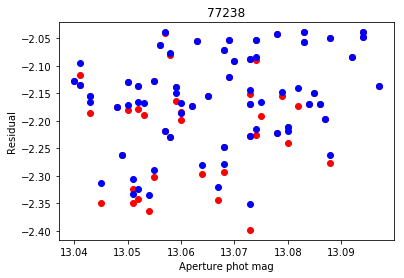

0.057 0.328
0.0149086905588 0.0824933533789


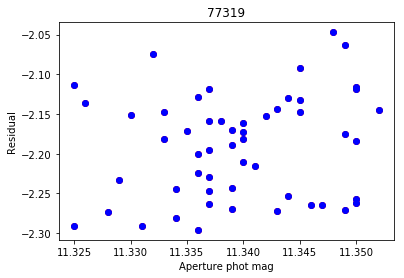

0.027 0.237
0.00704837579032 0.0638283174757


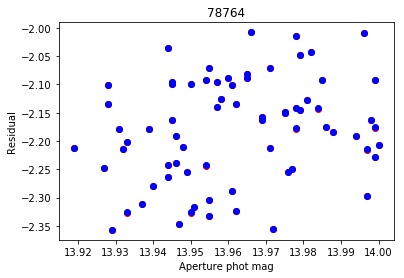

0.081 0.353
0.0213470022499 0.0879350989687


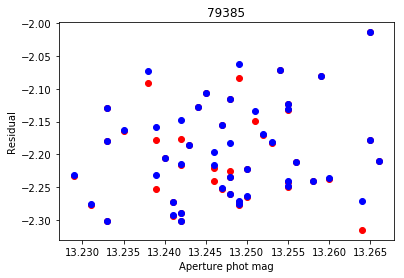

0.037 0.264
0.00911729126441 0.0689978738602


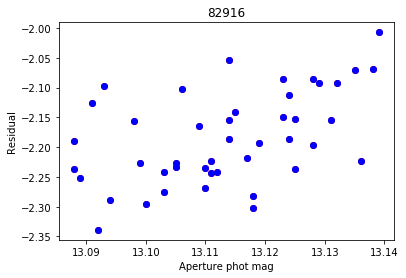

0.051 0.285
0.0143507565959 0.0709633060517


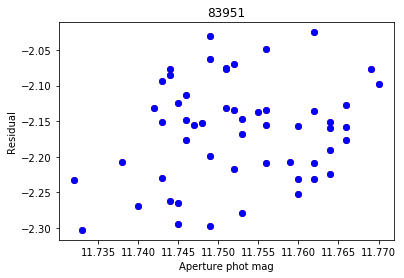

0.038 0.268
0.00907726701194 0.0693183051931


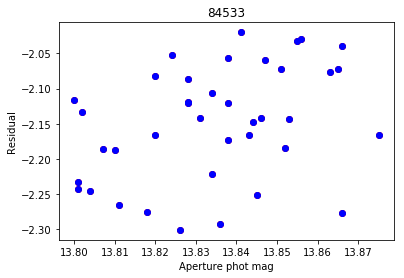

0.075 0.282
0.0203543881678 0.0752211029743


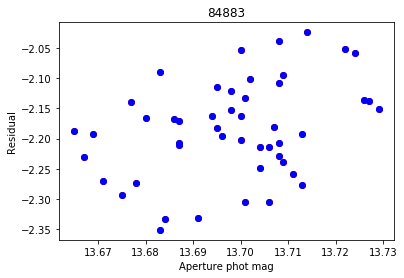

0.064 0.296
0.0159660555729 0.0755174252105


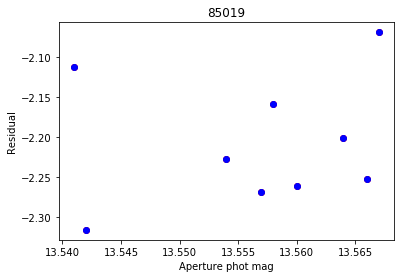

0.026 0.222
0.00899519762134 0.074679231747


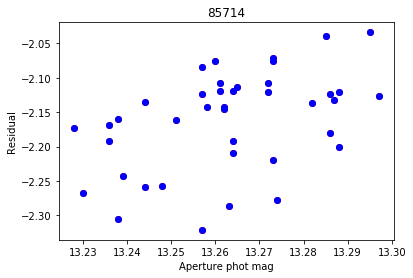

0.069 0.253
0.0182619139194 0.0651387749347


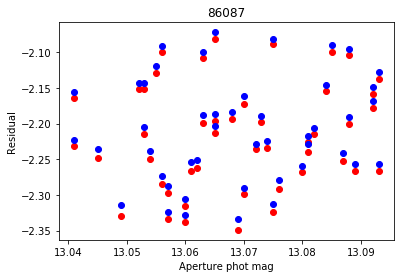

0.052 0.266
0.0145031122401 0.0713252222891


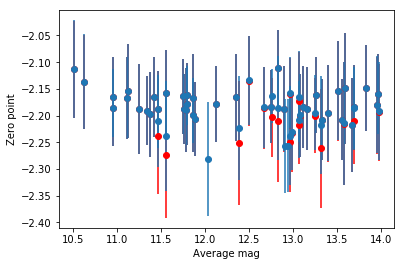

-2.18640307992 0.0327637715402
-2.1857221349 0.0323625852221


In [6]:
I2zp, I2zper = calibration.find_zp_bcds('I2', data_dir=folder)

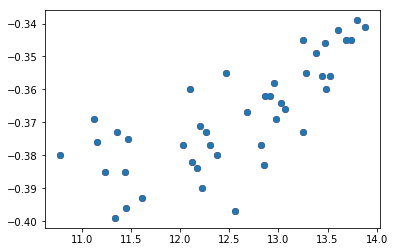

-0.368372093023 0.0161461684645
-0.368302325581 0.0162115877072
There are 55 psf stars.


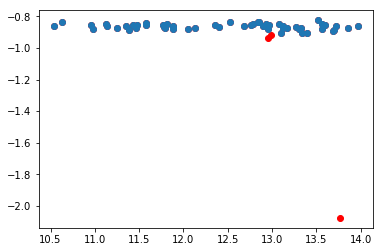

-0.873315789474 0.0264642479084
-0.862981818182 0.0174016623125
There are 63 psf stars.


In [7]:
I1_mosaic_zp, I1_mosaic_zper = calibration.find_zp_deep_mosaic(target, 'I1', data_dir=folder)
I2_mosaic_zp, I2_mosaic_zper = calibration.find_zp_deep_mosaic(target, 'I2', data_dir=folder)

In [8]:
calibration.apply_calibration_bcds(target, 'I1', -2.072, data_dir=folder)
calibration.apply_calibration_bcds(target, 'I2', -2.182, data_dir=folder)

NameError: global name 'alf' is not defined

In [3]:
calibration.apply_calibration_deep_mosaic(target, 'I1', -0.37, data_dir=folder)
calibration.apply_calibration_deep_mosaic(target, 'I2', -0.86, data_dir=folder)

# CMD

In [4]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
analysis_routines.merge_opt_deep_catalogs(target, optical_dir, folder, cluster_coord=[center_ra, center_dec])

Reading optical catalog for NGC7078...
Finished reading optical catalog.
Reading MIR catalog for NGC7078...


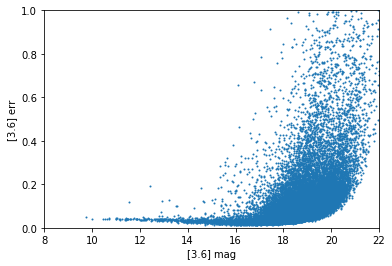

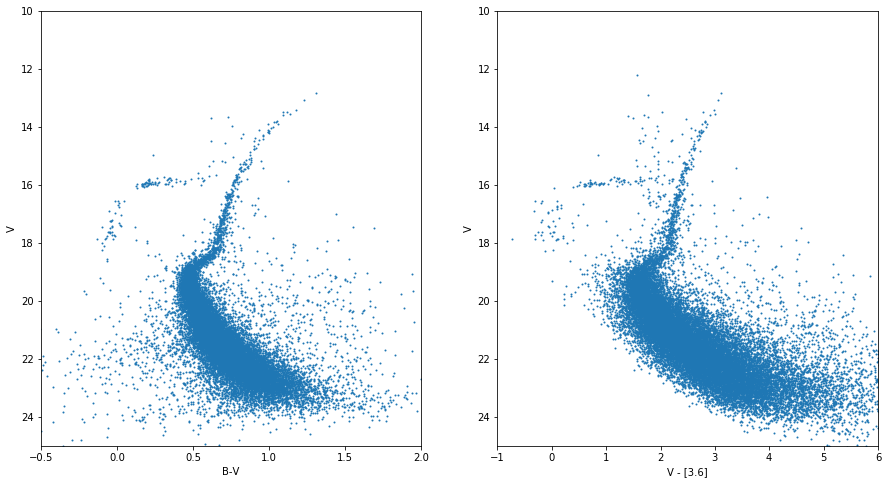

In [6]:
#center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorBV = catalog_data['B'][(dist > thres2) & (dist < thres)] - catalog_data['V'][(dist > thres2) & (dist < thres)]
Vmag = catalog_data['V'][(dist > thres2) & (dist < thres)]
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(magIR, err, s=1, edgecolor=None)
ax1.set_ylim((0,1.0))
ax1.set_xlim((8,22))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(15,8))
ax2 = fig2.add_subplot(121)
ax2.scatter(colorBV, Vmag, s=1, edgecolor=None)
ax2.set_ylim((25,10))
ax2.set_xlim((-0.5,2))
ax2.set_xlabel('B-V')
ax2.set_ylabel('V')
ax3 = fig2.add_subplot(122)
ax3.scatter(good_color, good_mag, s=1, edgecolor=None)
ax3.set_ylim((25,10))
ax3.set_xlim((-1,6))
ax3.set_xlabel('V - [3.6]')
ax3.set_ylabel('V')
mp.savefig(folder+target+'cmd.eps', format='eps')

# Variable stars

In [ ]:
# Find all stars identified as possible variables in optical catalog and list them in PeterIDs.txt

center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
optical.find_variables_fnl(optical_dir, target, center_ra, center_dec, data_dir=folder)

## First check on RRL PL relation

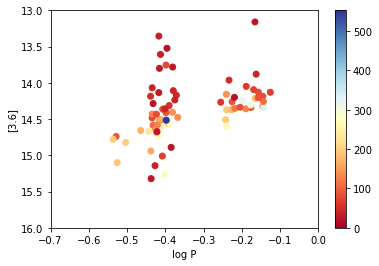

In [9]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

catalog_data = analysis_routines.read_merged_catalog(folder)

mag = np.zeros(len(data['id']))
dist = np.zeros(len(data['id']))

for ind, star in enumerate(data['id']):
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    if len(dao_id) == 0: continue
    m = catalog_data['3.6'][catalog_data['id'] == dao_id]  
    d = catalog_data['rad_dist'][catalog_data['id'] == dao_id]
    if m < 50: 
        mag[ind] = m
        dist[ind] = d
    if m > 50: 
        mag[ind] = np.nan
        dist[ind] = np.nan

cm = mp.cm.get_cmap('RdYlBu')    
mp.scatter(np.log10(data['new_period']), mag, c=dist, cmap=cm) 
mp.colorbar()
mp.ylim((16, 13))
mp.xlim((-0.7, 0))
mp.xlabel('log P')
mp.ylabel('[3.6]')
mp.savefig(target+'pl.eps', format='eps')

##  Generate MIR light curves matching optical ID numbers  

In [7]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder)

#### Phase MIR light curves

In [6]:
dtype1 = np.dtype([('id', 'S10'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

unknown_period = 0
good_lcvs = 0
no_mir = 0 
bad_mir = 0
total_RRL = len(data['id'])
for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'lcvs/mir/'+lcv+'.lcv'
    if np.isnan(data['new_period'][ind]) == 1:
        print lcv + ' no period'
        unknown_period += 1
        continue
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=1)
        print lcv + ' done.'
        good_lcvs += 1
    except IOError:
        print lcv +' not found.'
        no_mir += 1
    except:
        print lcv + ' error.'
        bad_mir += 1
print good_lcvs, no_mir, unknown_period, bad_mir, total_RRL

V2 done.
V3 done.
V4 done.
V5 done.
V6 done.
V7 done.
V8 done.
V9 done.
V10 done.
V11 done.
V12 done.
V13 done.
V14 done.
V15 done.
V16 done.
V17 done.
V18 done.
V19 done.
V20 done.
V21 done.
V22 done.
V23 done.
V24 done.
V25 done.
V26 done.
V28 no period
V29 no period
V30 done.
V31 done.
V32 done.
V33 done.
V35 done.
V36 done.
V37 not found.
V38 done.
V39 not found.
V40 done.
V41 done.
V42 done.
V43 not found.
V44 done.
V45 done.
V46=V112 done.
V47 done.
V48 done.
V49 not found.
V50 done.
V51 done.
V52 done.
V53 done.
V54 done.
V55 done.
V56 not found.
V57 not found.
V58 done.
V59 done.
V60 done.
V61 done.
V62 done.
V63 not found.
V64 done.
V65 done.
V66 done.
V67 not found.
V68 not found.
V69 not found.
V70 done.
V71 done.
V73=V179 not found.
V74 done.
V75 done.
V76 done.
V77 error.
V78 not found.
V79=V171 done.
V80 not found.
V81 done.
V82 done.
V83 not found.
V84 not found.
V85=V168 done.
V87=NV13 done.
V88 done.
V89 done.
V90 done.
V91 no period
V92 done.
V93 done.
V94 not found.


#### Create figure with all bands phased together

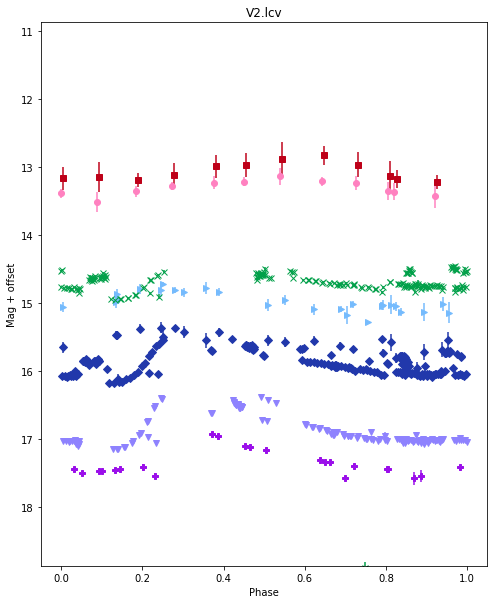

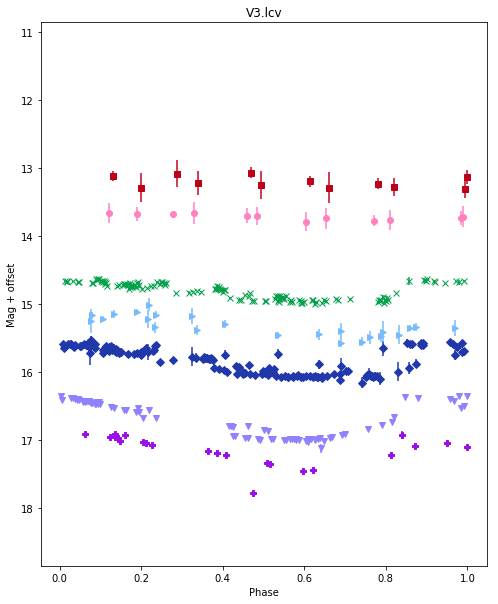

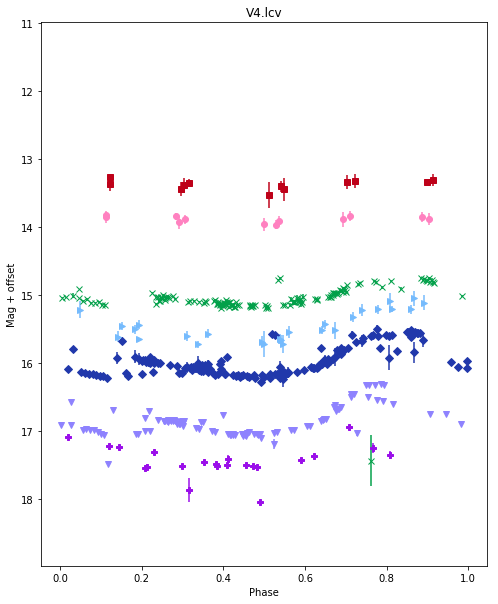

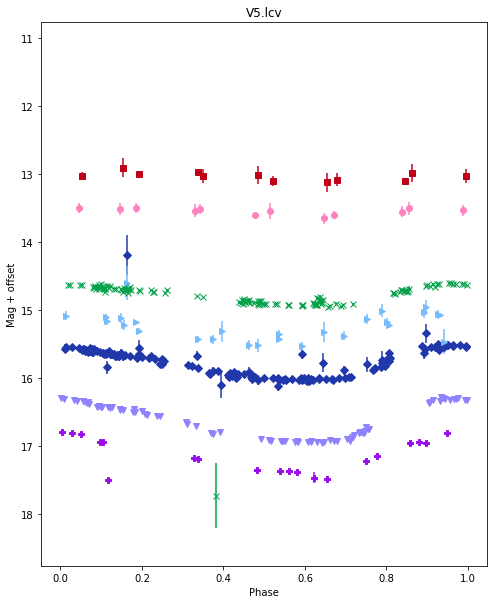

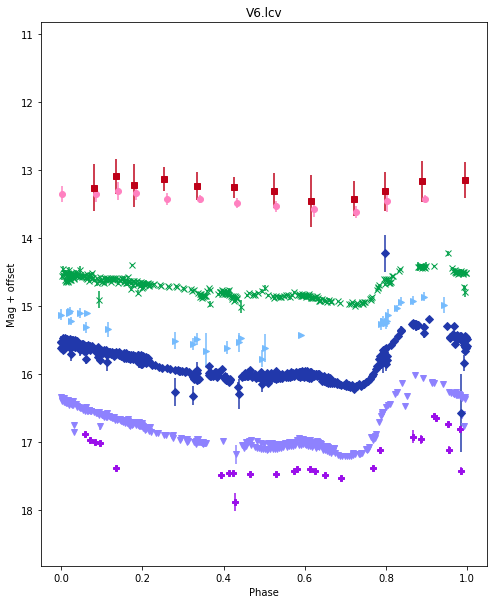

...

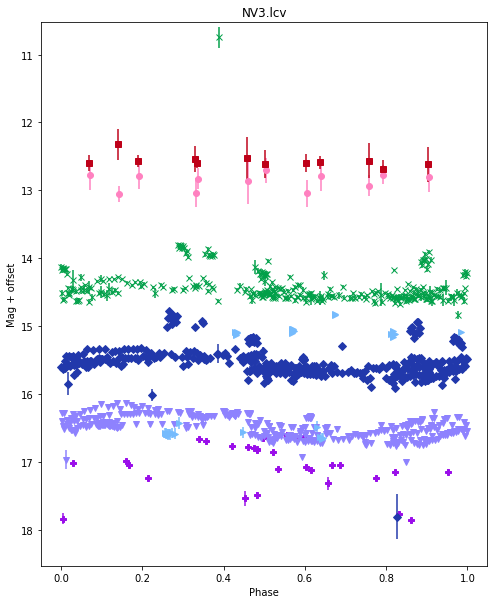

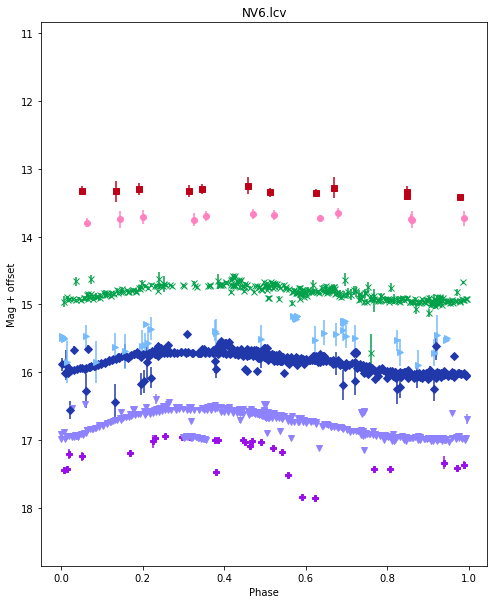

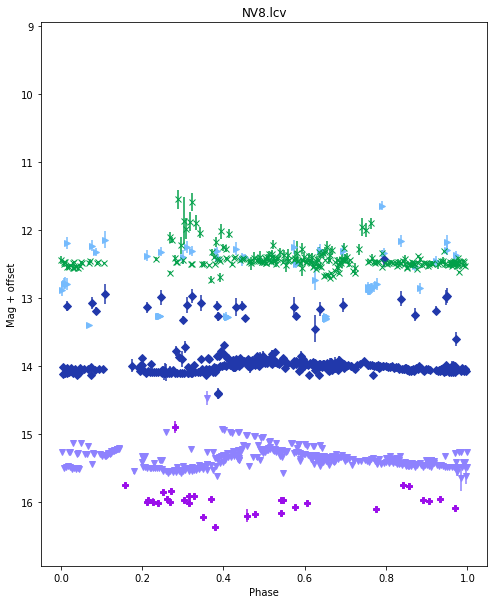

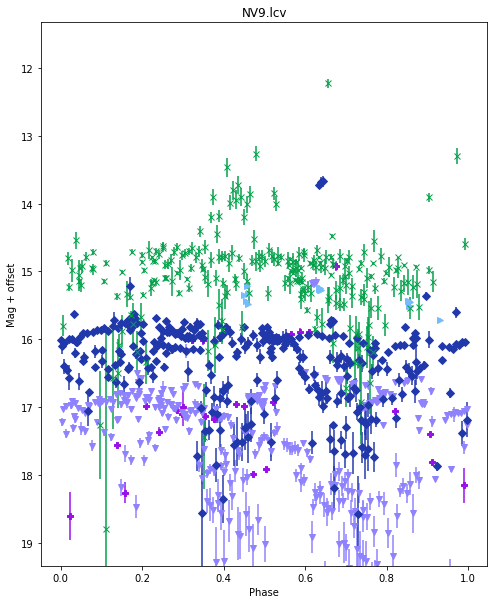

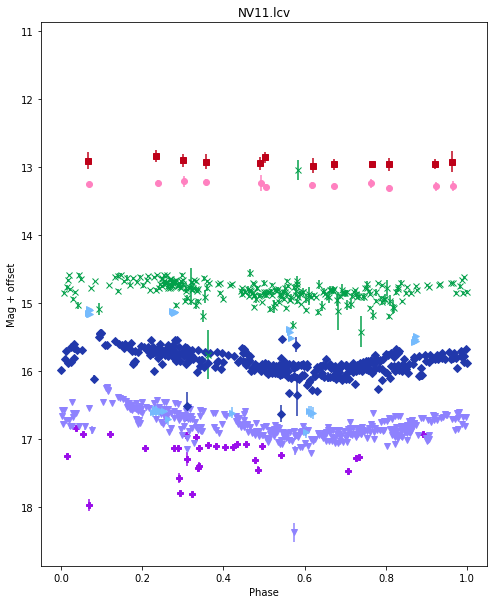

In [9]:
dtype1 = np.dtype([('id', 'S10'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    if np.isnan(data['new_period'][ind]) == 1:
        continue
    try:
        lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder)
    except:
        print star, ' error.'
        continue

## Fit light curves

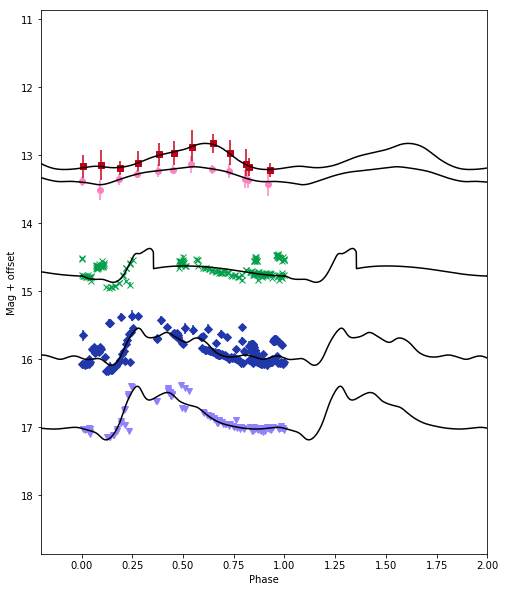

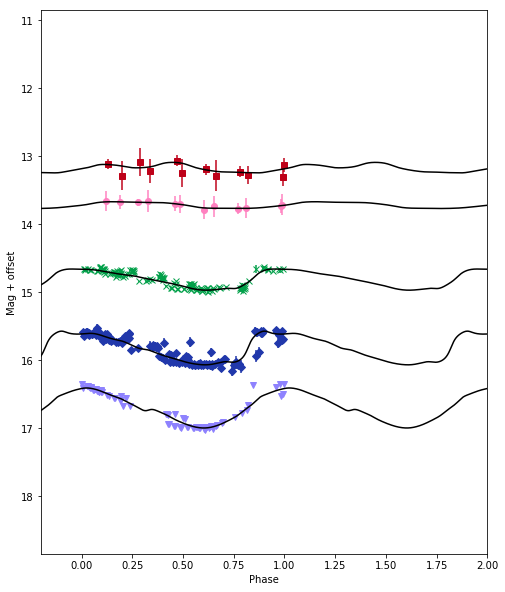

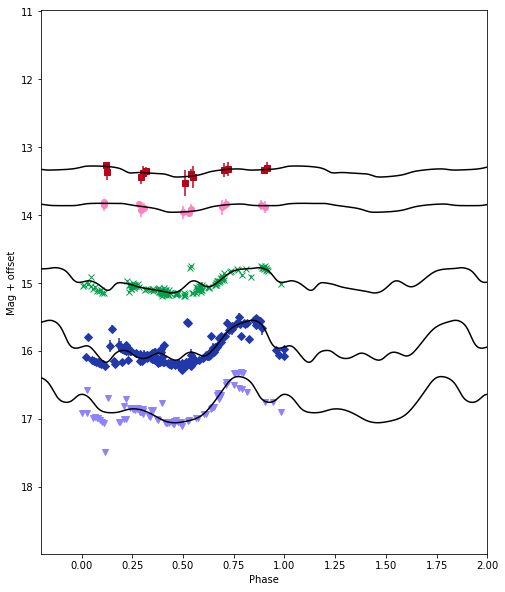

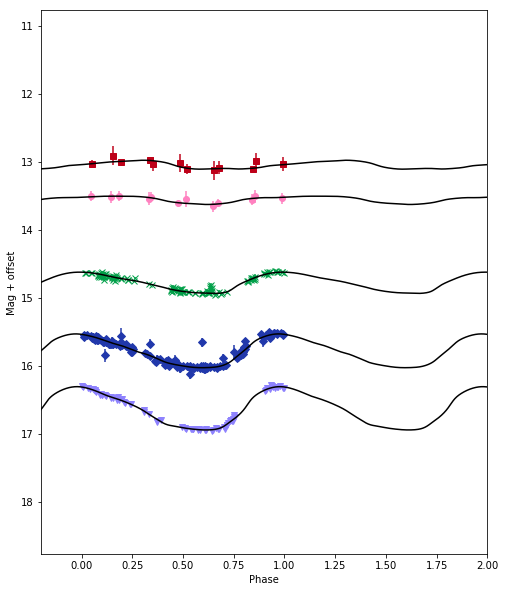

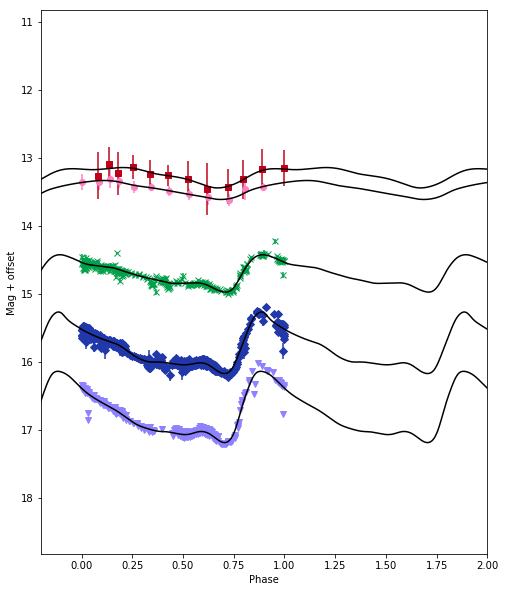

...

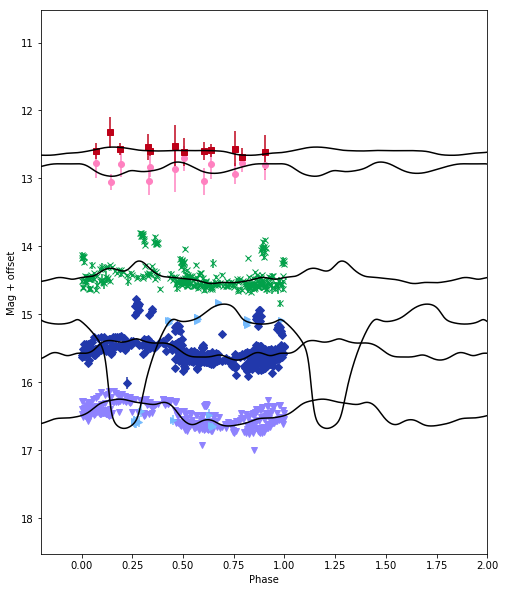

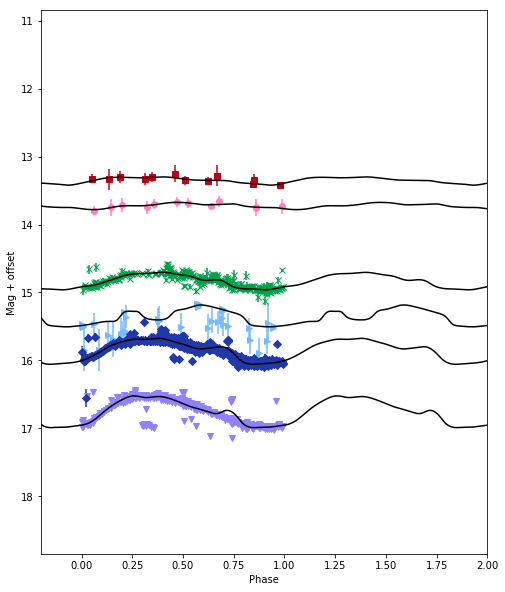

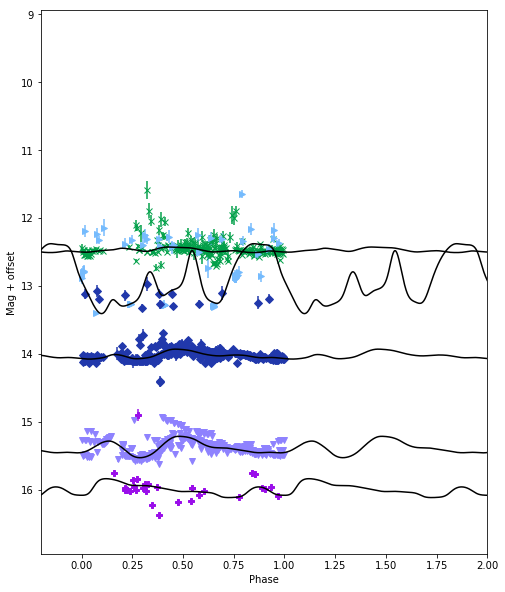

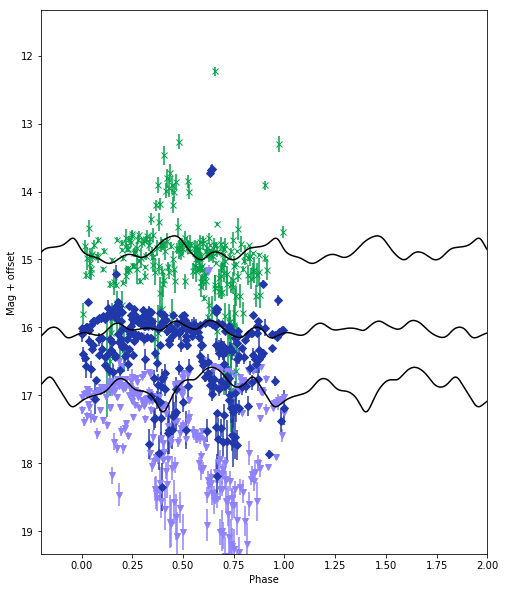

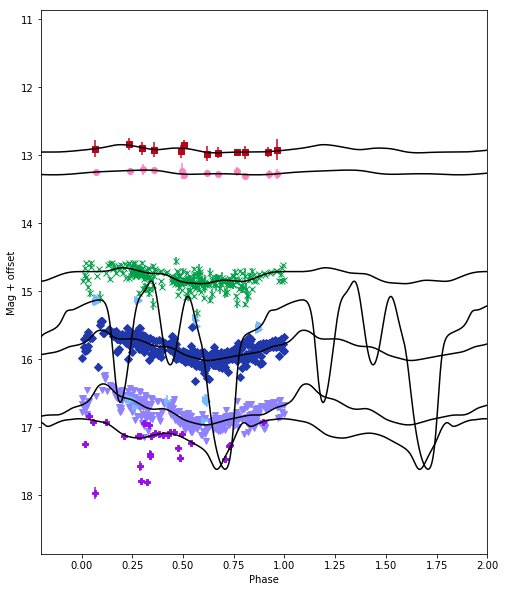

In [10]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
f = open(folder+'avg_mags.txt', 'w')

for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]) == 1: 
            continue
        filters, avgmag, err, amp, sigma = lightcurves.gloess(folder+'lcvs/'+star+'.phased', ask=0, master_plot=1, clean=1)
        datasave = np.array(zip(np.repeat(star, len(filters)),filters, np.repeat(data['new_period'][ind], len(filters)), avgmag, err, amp, sigma), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float), ('c7', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %6.4f %4.2f %4.2f')
    except:
        continue
        print 'Star '+star+' failed.'
f.close()

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in divide


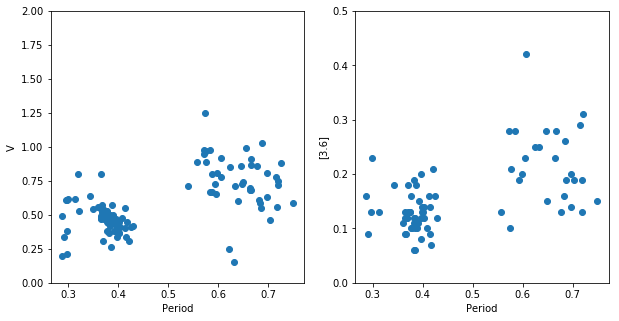

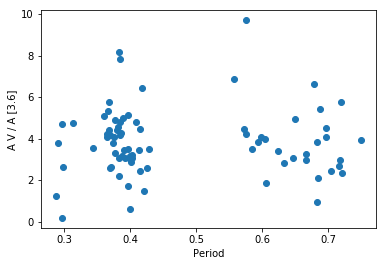

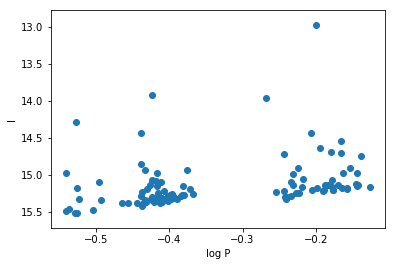

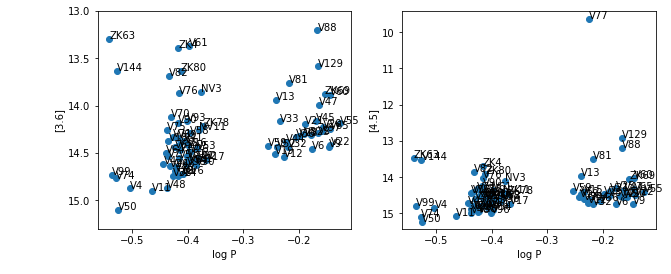

In [11]:
dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,5))

perV = data['period'][data['filt'] == 'V']
perI1 = data['period'][data['filt'] == 'I1']
perI2 = data['period'][data['filt'] == 'I2']
Vamp = data['amp'][data['filt'] == 'V']
I1amp = data['amp'][data['filt'] == 'I1']
I2amp = data['amp'][data['filt'] == 'I2']
I1 = data['avg'][data['filt'] == 'I1']
I2 = data['avg'][data['filt'] == 'I2']
V = data['avg'][data['filt'] == 'V']

# Bailey diagram
fig = mp.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.plot(perV[V > 0], Vamp[V > 0], 'o')
ax.set_ylim((0,2))
ax.set_xlabel('Period')
ax.set_ylabel('V')
ax2 = fig.add_subplot(122)
ax2.plot(perI1[I1 > 0], I1amp[I1 > 0], 'o')
ax2.set_ylim((0,0.5))
ax2.set_xlabel('Period')
ax2.set_ylabel('[3.6]')


# amplitude ratio 

R_amp = Vamp/I1amp
fig3 = mp.figure()
ax4 = fig3.add_subplot(111)
ax4.plot(perV, R_amp, 'o')
ax4.set_xlabel('Period')
ax4.set_ylabel('A V / A [3.6]')

# I band PL relation
fig5 = mp.figure()
ax5 = fig5.add_subplot(111)
Iper = data['period'][data['filt'] == 'I']
I = data['avg'][data['filt'] == 'I']
ax5.plot(np.log10(Iper[I > 0]), I[I > 0], 'o')
ax5.set_ylim((np.max(I[I > 0])+0.2,np.min(I[I>0])-0.2))
ax5.set_xlabel('log P')
ax5.set_ylabel('I')

# IRAC PL relation
fig2 = mp.figure(figsize=(10,4))
ax1 = fig2.add_subplot(121)
ax2 = fig2.add_subplot(122)
ax1.plot(np.log10(perI1[I1 > 0]), I1[I1 > 0], 'o')
ax1.set_ylim((np.max(I1[I1 > 0])+0.2,np.min(I1[I1 > 0])-0.2))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
ax2.plot(np.log10(perI2[I2 > 0]), I2[I2 > 0], 'o')
ax2.set_ylim((np.max(I2[I2 > 0])+0.2,np.min(I2[I2 > 0])-0.2))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

I1_labels = data['star'][data['filt'] == 'I1']
for label, x, y in zip(I1_labels, np.log10(perI1), I1):
    ax1.annotate(label, xy=(x, y))

I2_labels = data['star'][data['filt'] == 'I2']
for label, x, y in zip(I2_labels, np.log10(perI2), I2):
    ax2.annotate(label, xy=(x, y))

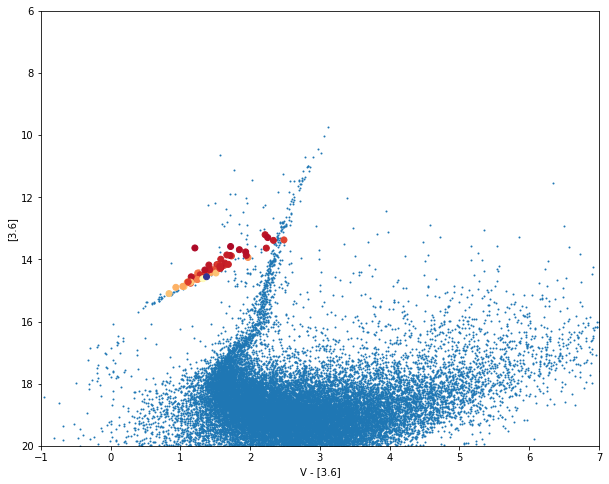

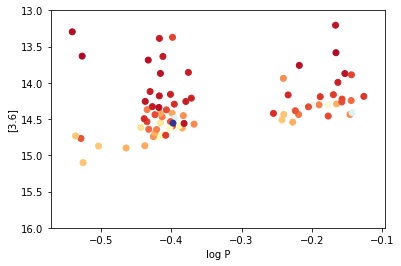

In [12]:
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(10,8))
ax2 = fig2.add_subplot(111)
ax2.scatter(colorVIR, magIR, s=1, edgecolor=None)
ax2.set_ylim((20,6))
ax2.set_xlim((-1,7))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('err', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,4,5))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

var_color = data['avg'][data['filt'] == 'V'] - data['avg'][data['filt'] == 'I1']
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']
var_err = data['err'][data['filt'] == 'I1']

rdists = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]

cm = mp.cm.get_cmap('RdYlBu')    
ax2.scatter(var_color, var_mag, c=rdists, cmap=cm) 
#ax2.plot(var_color, var_mag, 'o', color='r')

fig3 = mp.figure()
ax3 = fig3.add_subplot(111)
ax3.scatter(np.log10(var_period), var_mag, c=rdists, cmap=cm) 
#mp.colorbar()
#ax3.plot(np.log10(var_period), var_mag, 'o')
ax3.set_ylim((16,13))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')

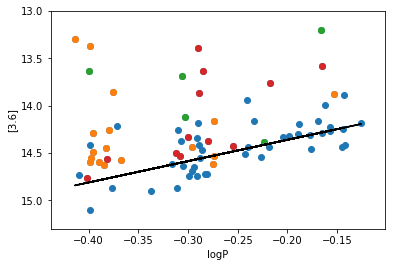

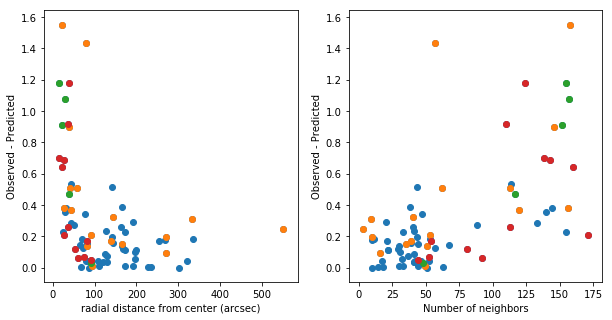

In [35]:
import numpy.ma as ma
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']
var_err = data['err'][data['filt'] == 'I1']
var_mag = var_mag[~np.isnan(var_period)]
var_id = var_id[~np.isnan(var_period)]
var_err = var_err[~np.isnan(var_period)]
var_period = var_period[~np.isnan(var_period)]

cat_ra, cat_dec = coordinates.hms2deg(catalog_data['ra_h'], catalog_data['ra_m'], 
                                      catalog_data['ra_s'], catalog_data['dec_d'], 
                                      catalog_data['dec_m'], catalog_data['dec_s'])

rdists = np.zeros(len(var_id))
num_neighbors = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]
    # find neighbors
    # need to find coordinates of the RRL 
    RRL_ra = cat_ra[catalog_data['id'] == dao_id[0]]
    RRL_dec = cat_dec[catalog_data['id'] == dao_id[0]]
    d = coordinates.radial_dist(RRL_ra, RRL_dec, cat_ra, cat_dec)
    num_neighbors[ind] = len(d[d < 8.0])
    
var_id = var_id[var_mag > 0]
var_logP = np.log10(var_period[var_mag > 0])
rdists = rdists[var_mag > 0]
var_err = var_err[var_mag > 0]
num_neighbors = num_neighbors[var_mag > 0]
var_mag = var_mag[var_mag > 0]
var_logP[var_logP < -0.4] += 0.127

# Double mode RRL
# V17, V26, V30, V31, V39, V51, V53, V54, V58, V61, V62, V67, V93, V96, V100=NV12, V101,
# V104, V106, V111, V118, V132=V151, V133, V145, V172=ZK13, V174=ZK10, V178, V181=ZK14, 
# ZK63, ZK69, NV3?, NV11 
double = ['NV11', 'NV3', 'V101', 'V17', 'V26', 'V30', 'V31', 'V51', 'V53', 'V54', 'V58', 
         'V61', 'V62', 'V93', 'V96', 'ZK63', 'ZK69'] 
mask_double = np.in1d(var_id, double)

# Stars with bad periods
# NV8, NV9, V107=NV2, V115=V163, V120=NV7, V130, V131, 
# V137, V139=ZK44, V141, V144, V15, V155=V176, V161=ZK39, V162=ZK18, V166=ZK22, V167, 
# V169=ZK23, V175=ZK6, V44, V68, V70, 
# V77, V82, V83, V85=V168, V88, V89, ZK34, ZK5, ZK67, 
bad_period = ['V144', 'V44', 'V70', 'V82', 'V88']
mask_period = np.in1d(var_id, bad_period)

# Other stars with bad MIR lcvs
bad_lcv = ['V129', 'V41', 'V59', 'V64', 'V7', 'V71', 'V74', 'V76', 'V81', 'V92', 'ZK4', 'ZK80', ]
mask_lcv = np.in1d(var_id, bad_lcv)


# Theoretical relation
feh = -2.37
mu = 15.13
plz = -2.251*var_logP + 0.180*feh - 0.793 + mu
fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.scatter(var_logP, var_mag)
ax1.scatter(var_logP[mask_double], var_mag[mask_double])
ax1.scatter(var_logP[mask_period], var_mag[mask_period])
ax1.scatter(var_logP[mask_lcv], var_mag[mask_lcv])
ax1.plot(var_logP, plz, 'k-')
ax1.set_ylim(np.max(var_mag)+0.2, np.min(var_mag)-0.2)
ax1.set_xlabel('logP')
ax1.set_ylabel('[3.6]')

residuals = np.abs(var_mag - plz)
fig2 = mp.figure(figsize=(10,5))
ax1 = fig2.add_subplot(121)
ax1.scatter(rdists, residuals)
ax1.scatter(rdists[mask_double], residuals[mask_double])
ax1.scatter(rdists[mask_period], residuals[mask_period])
ax1.scatter(rdists[mask_lcv], residuals[mask_lcv])
ax1.set_xlabel('radial distance from center (arcsec)')
ax1.set_ylabel('Observed - Predicted')
ax2 = fig2.add_subplot(122)
ax2.scatter(num_neighbors, residuals)
ax2.scatter(num_neighbors[mask_double], residuals[mask_double])
ax2.scatter(num_neighbors[mask_period], residuals[mask_period])
ax2.scatter(num_neighbors[mask_lcv], residuals[mask_lcv])
ax2.set_xlabel('Number of neighbors')
ax2.set_ylabel('Observed - Predicted')



[ -2.13992177  13.89878548]
0.203725401295
[ -2.12272151  13.968344  ]
0.176667002271


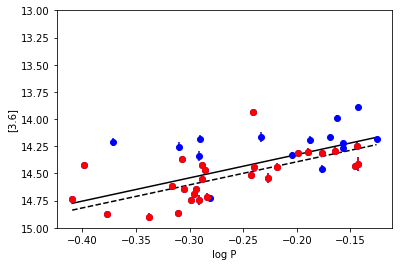

In [36]:
m_id = ma.array(var_id)
m_id[mask_double] = ma.masked
m_id[mask_period] = ma.masked
m_id[mask_lcv] = ma.masked
m_logP = ma.array(var_logP)
m_logP[mask_double] = ma.masked
m_logP[mask_period] = ma.masked
m_logP[mask_lcv] = ma.masked
m_mag = ma.array(var_mag)
m_mag[mask_double] = ma.masked
m_mag[mask_period] = ma.masked
m_mag[mask_lcv] = ma.masked
m_err = ma.array(var_err)
m_err[mask_double] = ma.masked
m_err[mask_period] = ma.masked
m_err[mask_lcv] = ma.masked

good_logP = m_logP[rdists > 100]
good_mag = m_mag[rdists > 100]
good_err = m_err[rdists > 100]
good_id = m_id[rdists > 100]


fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.errorbar(m_logP, m_mag, yerr=m_err, fmt='o', color='b')
ax1.errorbar(good_logP, good_mag, yerr=good_err, fmt='o', color='r')
ax1.set_ylim((15,13))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')

fit = ma.polyfit(m_logP, m_mag, 1)
print fit
residuals =m_mag - (fit[0]*m_logP + fit[1])
print np.std(residuals)

fit2 = ma.polyfit(good_logP, good_mag, 1)
print fit2
x_line = np.array([np.min(m_logP), np.max(m_logP)])
yline1 = fit[0]*x_line+fit[1]
yline2 = fit2[0]*x_line+fit2[1]

ax1.plot(x_line, yline1, 'k-')
ax1.plot(x_line, yline2, 'k--')


residuals2 = good_mag - (fit2[0]*good_logP + fit2[1])

print np.std(residuals2)

[73, 66, 12, 67, 43, 45, 51, 56, 57, 58, 61, 72]
[ -2.35617853  13.7656552 ]
[ -1.52954704  14.24602476]
0.221950351164


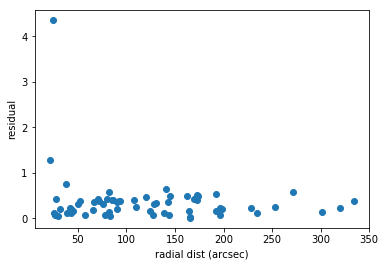

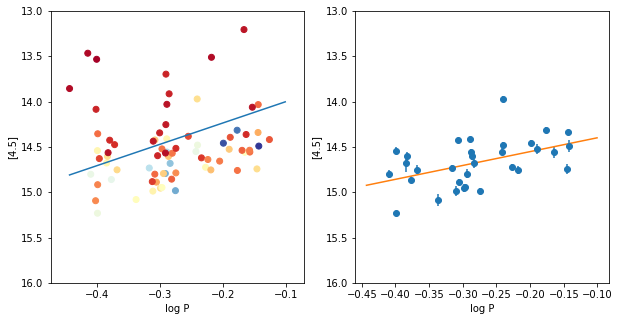

In [22]:
var_mag = data['avg'][data['filt'] == 'I2']
var_id = data['star'][data['filt'] == 'I2']
var_period = data['period'][data['filt'] == 'I2']
var_err = data['err'][data['filt'] == 'I2']
var_mag = var_mag[~np.isnan(var_period)]
var_id = var_id[~np.isnan(var_period)]
var_err = var_err[~np.isnan(var_period)]
var_period = var_period[~np.isnan(var_period)]

rdists = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]
    
var_id = var_id[var_mag > 0]
var_logP = np.log10(var_period[var_mag > 0])
rdists = rdists[var_mag > 0]
var_err = var_err[var_mag > 0]
var_mag = var_mag[var_mag > 0]
var_logP[var_logP < -0.4] += 0.127



# remove stars with bad light curves
bad_lcv = ['NV3', 'V129', 'V14', 'V144', 'V59', 'V61', 'V71', 'V81', 
           'V82', 'V88', 'V92', 'ZK80']

bad_index = [np.argwhere(var_id == x)[0][0] for x in bad_lcv]
print bad_index
masked_id = ma.array(var_id)
masked_id[bad_index] = ma.masked
masked_logP = ma.array(var_logP)
masked_logP[bad_index] = ma.masked
masked_mag = ma.array(var_mag)
masked_mag[bad_index] = ma.masked
masked_dists = ma.array(rdists)
masked_dists[bad_index] = ma.masked
masked_err = ma.array(var_err)
masked_err[bad_index] = ma.masked

# remove stars with questionable period?
# identify blended radius?
# remove stars near core of the cluster

fit = np.polyfit(masked_logP, masked_mag, 1)
print fit
residuals = np.abs(masked_mag - (fit[0]*masked_logP+fit[1]))
fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(masked_dists, residuals, 'o')
ax1.set_xlabel('radial dist (arcsec)')
ax1.set_ylabel('residual')

fig3 = mp.figure(figsize=(10,5))
ax3 = fig3.add_subplot(121)
ax3.scatter(var_logP, var_mag, c=rdists, cmap=cm) 
#mp.colorbar()
#ax3.plot(np.log10(var_period), var_mag, 'o')
x_line = np.array([np.min(var_logP), np.max(var_logP)])
y_line = fit[0]*x_line + fit[1]
ax3.plot(x_line, y_line)
ax3.set_ylim((16,13))
ax3.set_xlabel('log P')
ax3.set_ylabel('[4.5]')
thresh = 100.
good_logP = masked_logP[masked_dists > thresh]
good_mag = masked_mag[masked_dists > thresh]
good_err = masked_err[masked_dists > thresh]
ax4 = fig3.add_subplot(122)
#ax4.scatter(masked_logP[masked_dists > thresh], masked_mag[masked_dists > thresh], c=masked_dists[masked_dists > thresh], cmap=cm) 
ax4.errorbar(good_logP, good_mag, yerr = good_err, fmt='o')
ax4.set_ylim((16,13))
ax4.set_xlabel('log P')
ax4.set_ylabel('[4.5]')

fit2 = np.polyfit(good_logP, good_mag, 1)
yline2 = fit2[0]*x_line+fit2[1]
ax4.plot(x_line, yline2)
residuals2 = good_mag - (fit2[0]*good_logP + fit2[1])
print fit2
print np.std(residuals2)